In [1]:
from paths import models_folder, metadata_folder, latent_space_folder

In [2]:
from pyobsbox import ObsBoxGenerator

In [3]:
import logging
import keras
import json
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from tqdm.auto import tqdm

In [4]:
logging.getLogger("pyobsbox").setLevel(logging.INFO)

# List models

In [5]:
list(models_folder.glob('model_*'))

[PosixPath('/afs/cern.ch/work/l/lcoyle/public/obsbox_analysis/models/model_conv_64_32_16_8_stride_4_B1H_Inst_znorm_abs_diff_seed_42'),
 PosixPath('/afs/cern.ch/work/l/lcoyle/public/obsbox_analysis/models/model_time_dist_32_16_B1H_Inst_500'),
 PosixPath('/afs/cern.ch/work/l/lcoyle/public/obsbox_analysis/models/model_conv_32_16_stride_4_B1H_Inst'),
 PosixPath('/afs/cern.ch/work/l/lcoyle/public/obsbox_analysis/models/model_conv_32_16_stride_4_B1H_Inst_jorg'),
 PosixPath('/afs/cern.ch/work/l/lcoyle/public/obsbox_analysis/models/model_conv_32_16_8_stride_4_B1H_Inst_presplit_center_scale_1000_seed_42'),
 PosixPath('/afs/cern.ch/work/l/lcoyle/public/obsbox_analysis/models/model_conv_32_16_8_stride_4_B1H_Inst_center_scale_10000_seed_42'),
 PosixPath('/afs/cern.ch/work/l/lcoyle/public/obsbox_analysis/models/model_conv_32_16_8_stride_4_B1H_Inst_center_scale_1000_seed_42'),
 PosixPath('/afs/cern.ch/work/l/lcoyle/public/obsbox_analysis/models/model_conv_32_16_8_stride_4_B1H_Inst_center_scale_100_s

In [6]:
model_path = models_folder / "model_conv_64_32_16_8_stride_4_B1H_Inst_znorm_abs_diff_seed_42"

In [7]:
list(model_path.glob('*fetched*'))

[PosixPath('/afs/cern.ch/work/l/lcoyle/public/obsbox_analysis/models/model_conv_64_32_16_8_stride_4_B1H_Inst_znorm_abs_diff_seed_42/validation_fetched.npy'),
 PosixPath('/afs/cern.ch/work/l/lcoyle/public/obsbox_analysis/models/model_conv_64_32_16_8_stride_4_B1H_Inst_znorm_abs_diff_seed_42/train_fetched.npy')]

# Load model and associated generators

In [8]:
model = keras.models.load_model(model_path)
model.summary()
model_metadata = json.load((model_path / "metadata.json").open('r'))
data_metadata_path = model_metadata["generator"]["metadata_path"]

# load the data metadata
data_metadata_df = pd.read_hdf(data_metadata_path)

# load the indices of the data seen by the model
train_seen_indices = np.load(model_path / "train_fetched.npy")
validation_seen_indices = np.load(model_path / "validation_fetched.npy")

# train/validation split
# train_split_indices = np.load(model_path / "train_split_indices.npy")
# validation_split_indices = np.load(model_path / "validation_split_indices.npy")

# load the data seen by the model
train_metadata = data_metadata_df.iloc[train_seen_indices]
validation_metadata = data_metadata_df.iloc[validation_seen_indices]

# the training loss history
hist = model_metadata["history"]

# create the generators
train_generator = ObsBoxGenerator(train_metadata,
                                  **model_metadata["generator"])
validation_generator = ObsBoxGenerator(validation_metadata,
                                       **model_metadata["generator"])

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d (Conv1D)              (None, 512, 64)           512       
_________________________________________________________________
dropout (Dropout)            (None, 512, 64)           0         
_________________________________________________________________
conv1d_1 (Conv1D)            (None, 128, 32)           14368     
_________________________________________________________________
dropout_1 (Dropout)          (None, 128, 32)           0         
_________________________________________________________________
conv1d_2 (Conv1D)            (None, 32, 16)            3600      
_________________________________________________________________
dropout_2 (Dropout)          (None, 32, 16)            0         
_________________________________________________________________
conv1d_3 (Conv1D)            (None, 8, 8)              9

Mar/02 01:19:17 pyobsbox.generator INFO: metadata_path: /afs/cern.ch/work/l/lcoyle/public/obsbox_analysis/metadata/metadata_B1H_Inst_34994.h5
Mar/02 01:19:17 pyobsbox.generator INFO: shuffle: True
Mar/02 01:19:17 pyobsbox.generator INFO: seed: 42
Mar/02 01:19:17 pyobsbox.generator INFO: batch_size: 8192
Mar/02 01:19:17 pyobsbox.generator INFO: sequence_length: 2048
Mar/02 01:19:17 pyobsbox.generator INFO: n_bunches: 256
Mar/02 01:19:17 pyobsbox.generator INFO: __len__: 1041
Mar/02 01:19:17 pyobsbox.generator INFO: fetched_log_folder: None
Mar/02 01:19:17 pyobsbox.generator INFO: fetched_log_prefix: 
Mar/02 01:19:17 pyobsbox.generator INFO: normalization: znorm
Mar/02 01:19:17 pyobsbox.generator INFO: normalization_pre_split: False
Mar/02 01:19:17 pyobsbox.generator INFO: normalization_kwargs: {}
Mar/02 01:19:17 pyobsbox.generator INFO: abs_diff: True
Mar/02 01:19:17 pyobsbox.generator INFO: diff: False
Mar/02 01:19:17 pyobsbox.generator INFO: metadata_path: /afs/cern.ch/work/l/lcoyle/p

In [9]:
print(train_metadata.shape)
train_metadata.head()

(266496, 11)


,type,fill,beam,plane,q,date_time,file,n_bunches,bunch_index,bunch_number,ts_length
7246083,Inst,6919,1,h,7,2018-07-13 18:25:14,/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6919/...,2556,349.0,248.0,65536
6889239,Inst,7453,1,h,7,2018-11-18 06:39:21,/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7453/...,480,531.0,97.0,65536
1617294,Inst,6663,1,h,7,2018-05-10 15:13:15,/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6663/...,2556,1225.0,883.0,65536
6141829,Inst,6953,1,h,7,2018-07-21 06:32:07,/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6953/...,2556,96.0,47.0,65536
593557,Inst,6245,1,h,7,2017-09-26 15:54:15,/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6245/...,1916,2108.0,1164.0,65536


In [10]:
print(validation_metadata.shape)
validation_metadata.head()

(3840, 11)


,type,fill,beam,plane,q,date_time,file,n_bunches,bunch_index,bunch_number,ts_length
966383,Inst,6272,1,h,7,2017-10-05 07:36:14,/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6272/...,1836,3139.0,1673.0,65536
480883,Inst,6761,1,h,7,2018-06-05 19:14:19,/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6761/...,1212,271.0,158.0,65536
5018514,Inst,7464,1,h,7,2018-11-22 07:11:14,/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7464/...,460,613.0,78.0,65536
8922766,Inst,6707,1,h,7,2018-05-20 14:29:14,/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6707/...,396,276.0,163.0,65536
2913998,Inst,6255,1,h,7,2017-09-29 06:36:14,/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6255/...,1916,1501.0,822.0,65536


# Loss functions

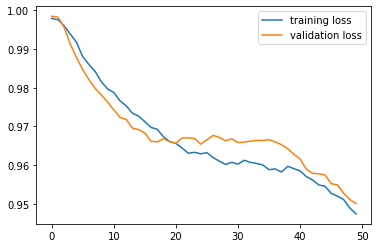

In [11]:
plt.plot(hist['loss'], label='training loss')
plt.plot(hist['val_loss'], label='validation loss')
plt.legend()

# Datasets

Load the first few batches

In [12]:
train_dataset = np.vstack([train_generator[i][0] for i in tqdm(range(50))])
train_dataset.shape

(409600, 2048, 1)

In [13]:
validation_dataset = np.vstack([validation_generator[i][0] for i in tqdm(range(5))])
validation_dataset.shape

(40960, 2048, 1)

# Predictions

In [14]:
train_pred = model.predict(train_dataset, verbose=1, batch_size=train_generator.batch_size)
train_pred.shape

50/50 [==============================] - 59s 1s/step


(409600, 2048, 1)

In [15]:
validation_pred = model.predict(validation_dataset, verbose=1, batch_size=validation_generator.batch_size)
validation_pred.shape

5/5 [==============================] - 5s 963ms/step


(40960, 2048, 1)

In [16]:
MAE_train = abs(train_pred - train_dataset).mean(axis=1).squeeze()
MAE_train.shape

(409600,)

In [17]:
MAE_validation = abs(validation_pred - validation_dataset).mean(axis=1).squeeze()
MAE_validation.shape

(40960,)

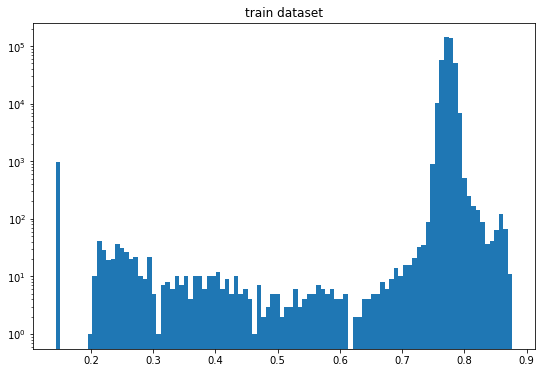

In [18]:
plt.figure(figsize=(9, 6))
n, bins, _ = plt.hist(MAE_train, bins=100)
plt.title("train dataset")
plt.yscale('log')

rough peak

In [19]:
hist_peak_train = bins[n.argmax()]
hist_peak_train

0.7669923151121659

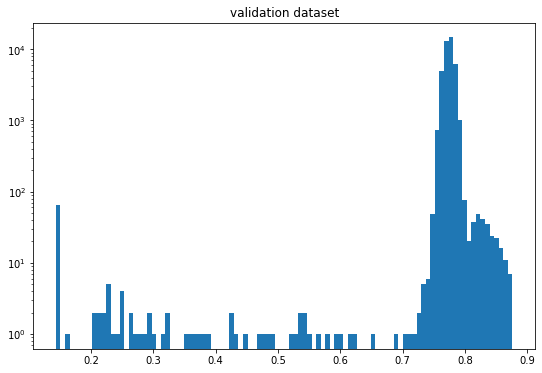

In [20]:
plt.figure(figsize=(9, 6))
n, bins, _ = plt.hist(MAE_validation, bins=100)
plt.title("validation dataset")
plt.yscale('log')

In [21]:
hist_peak_validation = bins[n.argmax()]
hist_peak_validation

0.7733582389548254

In [22]:
max_MAE_indices = np.argsort(MAE_train)[::-1]

In [23]:
max_MAE_indices

array([359543, 353065, 360233, ..., 145205, 249392,   9768])

In [24]:
def plot_true_pred(true_signal, pred_signal):
    fig, axes = plt.subplots(1, figsize=(16, 6))
    axes.plot(true_signal)
    axes.plot(pred_signal)

#     axes[1].plot(np.cumsum(true_signal))
#     axes[1].plot(np.cumsum(pred_signal))
    return fig, axes

index:  359543
MAE:  0.8769503158878094
n_bunches       924
bunch_index     864
bunch_number    631
Name: 3754799, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6965/instability_data/06965_Inst_B1H_Q7_20180723_22h12m15s.h5


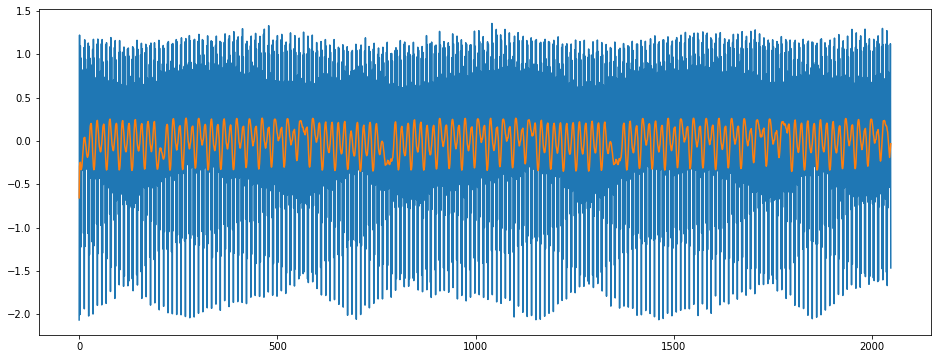

In [25]:
anomalous = 0
anomalous_index = max_MAE_indices[anomalous]

print('index: ', anomalous_index)
print("MAE: ", MAE_train[anomalous_index])
# I'm not sure this row is correct
metadata_row = train_generator.metadata.iloc[anomalous_index // 32]
print(metadata_row[['n_bunches', 'bunch_index', 'bunch_number']])
print(metadata_row['file'])

true_signal = train_dataset[anomalous_index].squeeze()
pred_signal = train_pred[anomalous_index].squeeze()

plot_true_pred(true_signal, pred_signal);

# Top rightmost signals

index:  359543
MAE:  0.8769503158878094
n_bunches       924
bunch_index     864
bunch_number    631
Name: 3754799, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6965/instability_data/06965_Inst_B1H_Q7_20180723_22h12m15s.h5


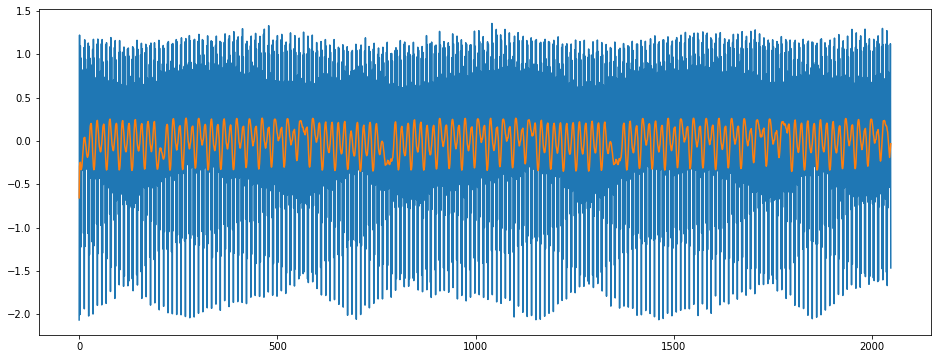

index:  353065
MAE:  0.876706532558057
n_bunches       468
bunch_index     828
bunch_number    398
Name: 577373, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7365/instability_data/07365_Inst_B1H_Q7_20181026_22h04m15s.h5


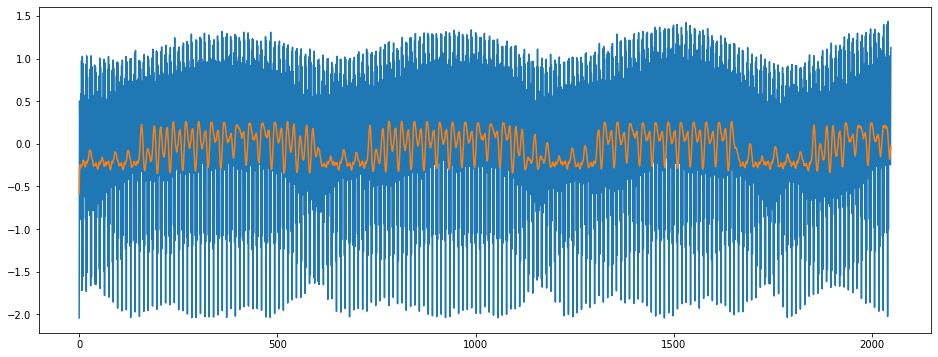

index:  360233
MAE:  0.8762501609408676
n_bunches       924
bunch_index     693
bunch_number    502
Name: 2966699, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7087/instability_data/07087_Inst_B1H_Q7_20180825_13h09m08s.h5


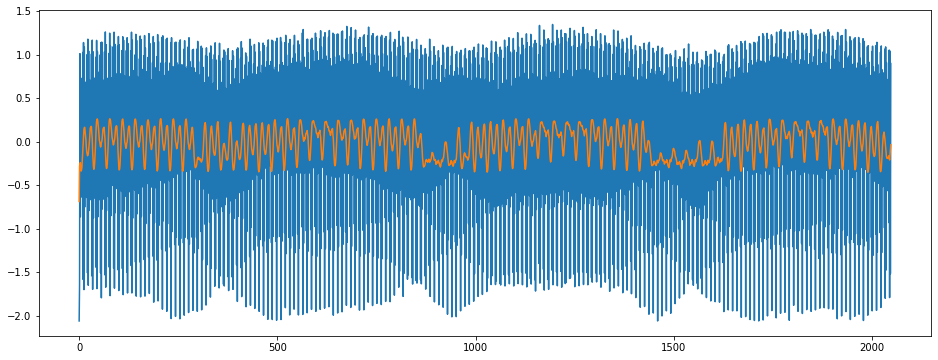

index:  222619
MAE:  0.8761783550822824
n_bunches       1868
bunch_index     2847
bunch_number    1522
Name: 10205405, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6349/instability_data/06349_Inst_B1H_Q7_20171031_06h35m14s.h5


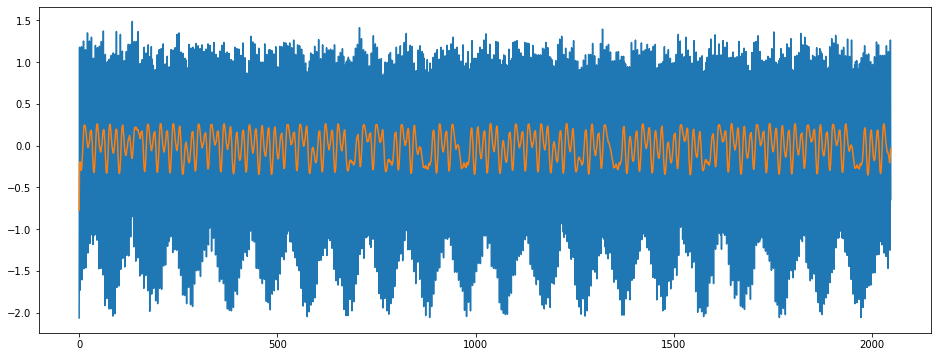

index:  306468
MAE:  0.8749065172220926
n_bunches       1212
bunch_index     1318
bunch_number     964
Name: 930646, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7145/instability_data/07145_Inst_B1H_Q7_20180910_04h30m11s.h5


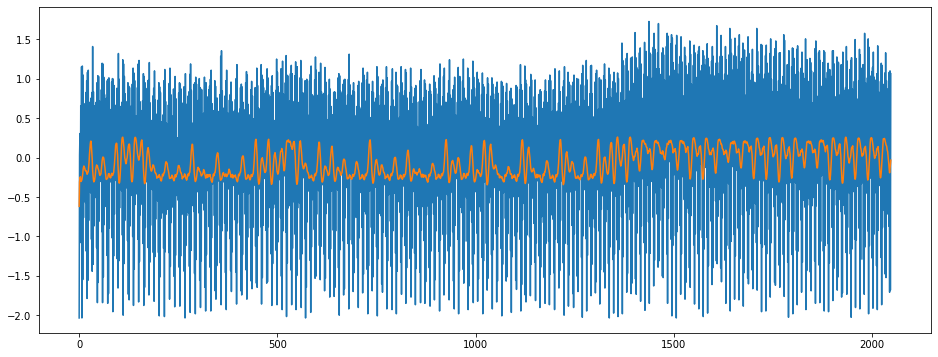

index:  229130
MAE:  0.873760366799246
n_bunches       1358
bunch_index     3348
bunch_number    1322
Name: 4211542, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6239/instability_data/06239_Inst_B1H_Q7_20170924_04h52m37s.h5


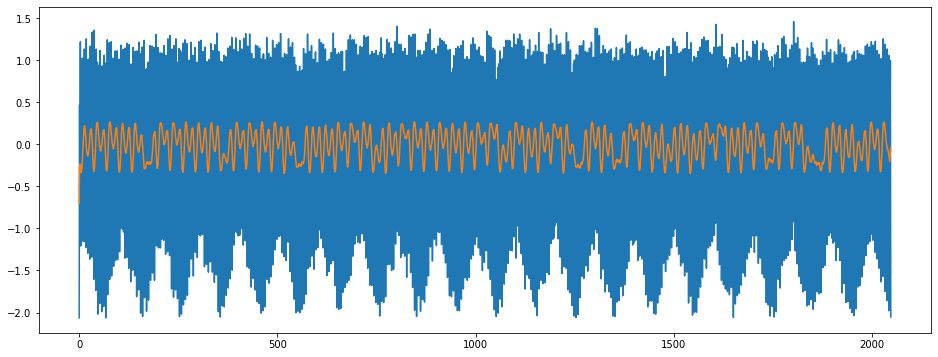

index:  227668
MAE:  0.8735512265902985
n_bunches       1227
bunch_index     1638
bunch_number     609
Name: 4463784, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6690/instability_data/06690_Inst_B1H_Q7_20180516_04h00m14s.h5


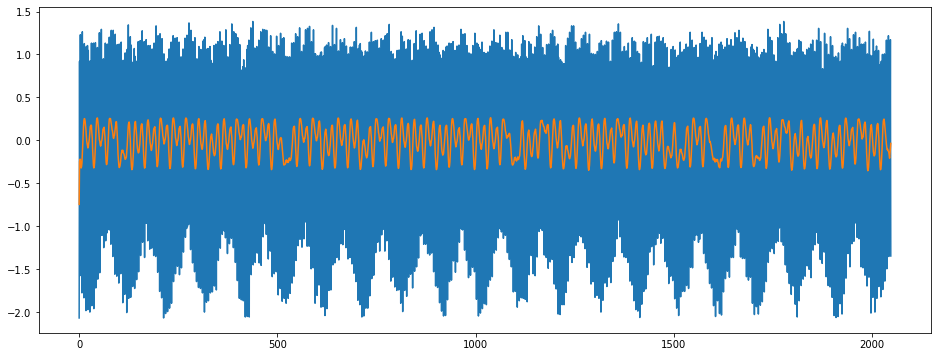

index:  268943
MAE:  0.8734665511256297
n_bunches       2556
bunch_index      359
bunch_number     239
Name: 1616650, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6663/instability_data/06663_Inst_B1H_Q7_20180510_15h13m15s.h5


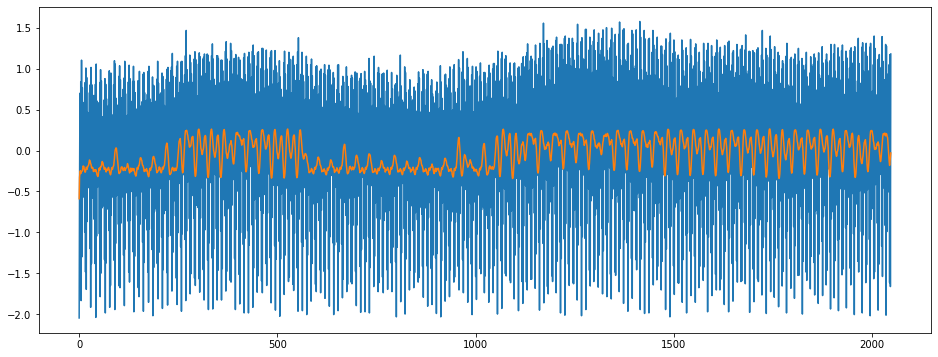

index:  98587
MAE:  0.8718596755364011
n_bunches       1068
bunch_index     1226
bunch_number     884
Name: 10744574, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6748/instability_data/06748_Inst_B1H_Q7_20180601_01h09m23s.h5


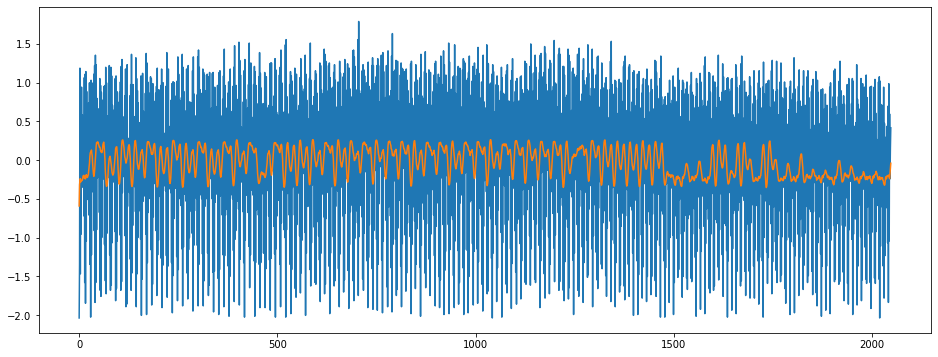

index:  175952
MAE:  0.8711430208191309
n_bunches       1868
bunch_index     3314
bunch_number    1785
Name: 8506935, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6364/instability_data/06364_Inst_B1H_Q7_20171107_06h20m15s.h5


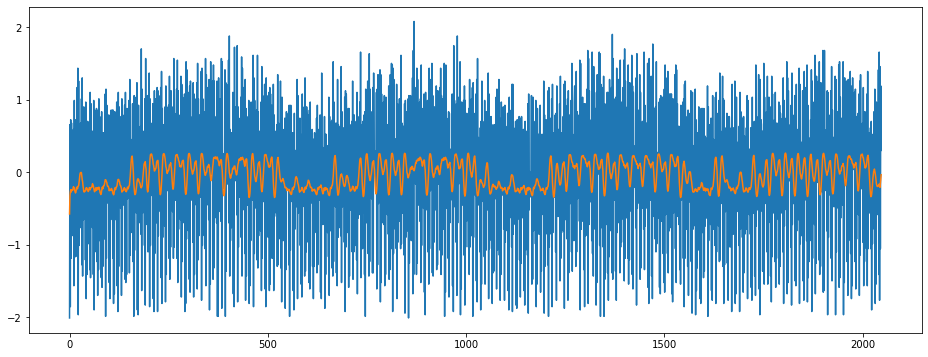

In [26]:
for i in range(10):
    anomalous = i
    anomalous_index = max_MAE_indices[anomalous]

    print('index: ', anomalous_index)
    print("MAE: ", MAE_train[anomalous_index])
    # I'm not sure this row is correct
    metadata_row = train_generator.metadata.iloc[anomalous_index // 32]
    print(metadata_row[['n_bunches', 'bunch_index', 'bunch_number']])
    print(metadata_row['file'])

    true_signal = train_dataset[anomalous_index].squeeze()
    pred_signal = train_pred[anomalous_index].squeeze()

    plot_true_pred(true_signal, pred_signal)
    plt.show()

# Top leftmost signals

index:  9768
MAE:  0.1438969773835197
n_bunches       1004
bunch_index      258
bunch_number     132
Name: 7089476, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6417/instability_data/06417_Inst_B1H_Q7_20171126_01h53m55s.h5


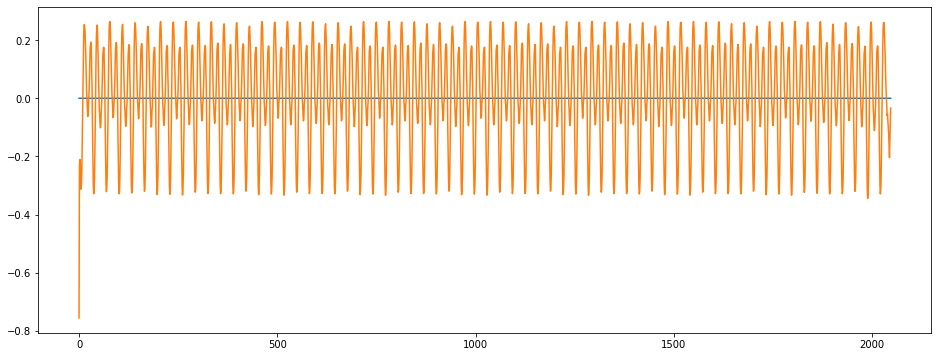

index:  249392
MAE:  0.1438969773835197
n_bunches       1452
bunch_index     1700
bunch_number     719
Name: 8375249, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6892/instability_data/06892_Inst_B1H_Q7_20180707_05h31m14s.h5


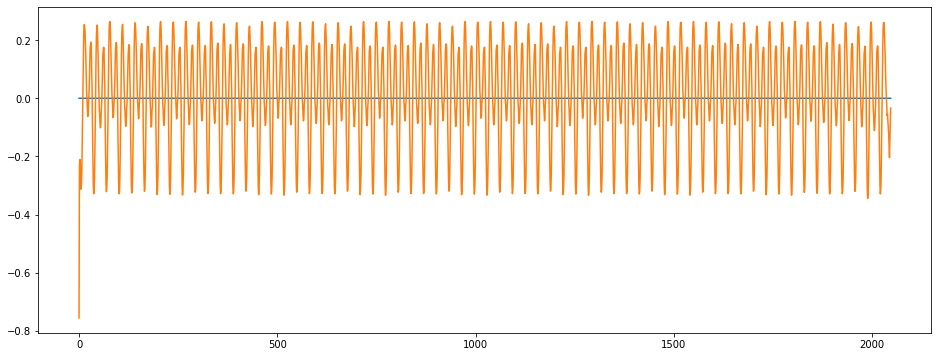

index:  145205
MAE:  0.1438969773835197
n_bunches       2460
bunch_index     1745
bunch_number    1284
Name: 9306359, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6640/instability_data/06640_Inst_B1H_Q7_20180504_09h59m52s.h5


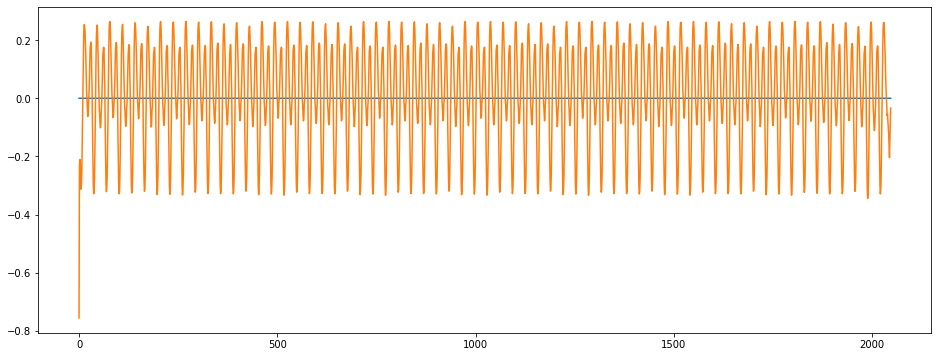

index:  249364
MAE:  0.1438969773835197
n_bunches       1068
bunch_index     1395
bunch_number    1027
Name: 6404428, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6776/instability_data/06776_Inst_B1H_Q7_20180611_16h59m57s.h5


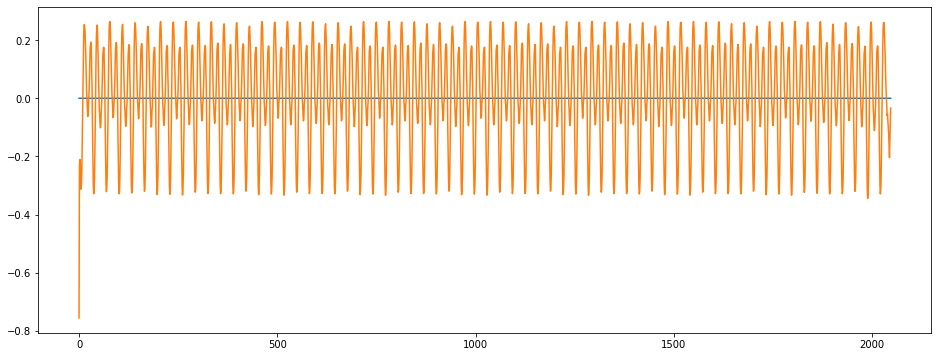

index:  249324
MAE:  0.1438969773835197
n_bunches        924
bunch_index     1224
bunch_number     901
Name: 5993112, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7040/instability_data/07040_Inst_B1H_Q7_20180809_19h15m36s.h5


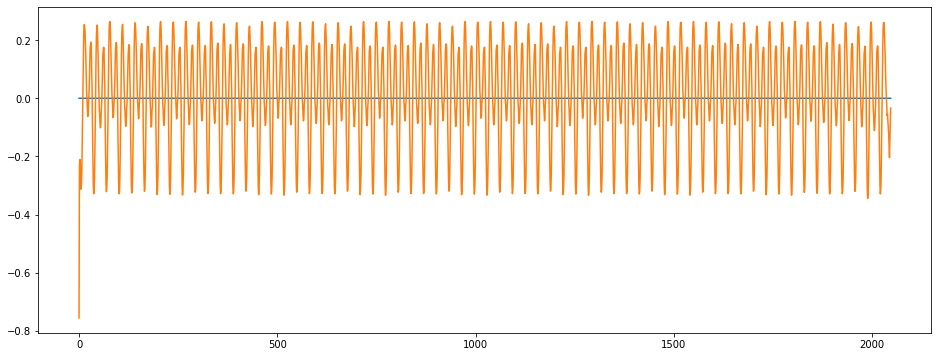

index:  350775
MAE:  0.1438969773835197
n_bunches       108
bunch_index     167
bunch_number     79
Name: 3475123, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6268/instability_data/06268_Inst_B1H_Q7_20171003_12h23m16s.h5


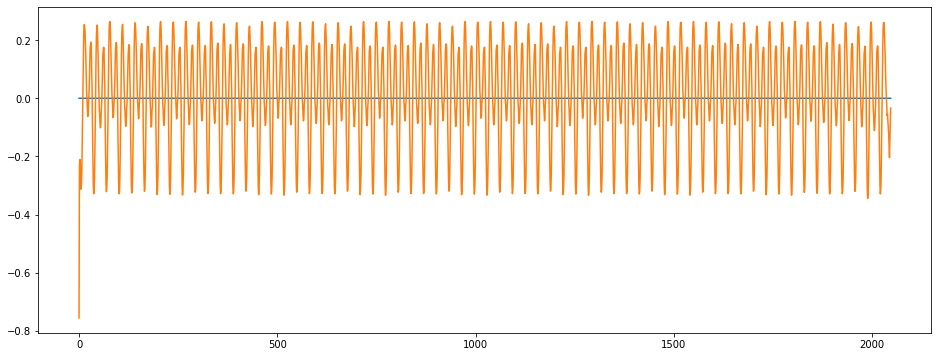

index:  382728
MAE:  0.1438969773835197
n_bunches       1227
bunch_index      506
bunch_number     225
Name: 9361265, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6624/instability_data/06624_Inst_B1H_Q7_20180430_04h44m15s.h5


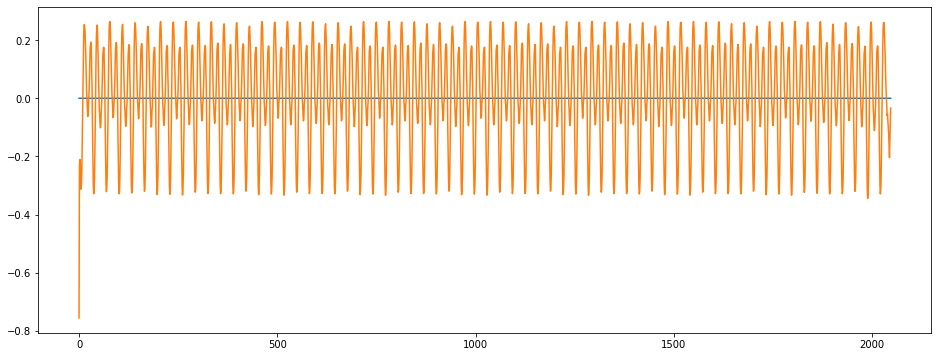

index:  73460
MAE:  0.1438969773835197
n_bunches       1452
bunch_index     3362
bunch_number    1430
Name: 11556607, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6890/instability_data/06890_Inst_B1H_Q7_20180705_16h51m15s.h5


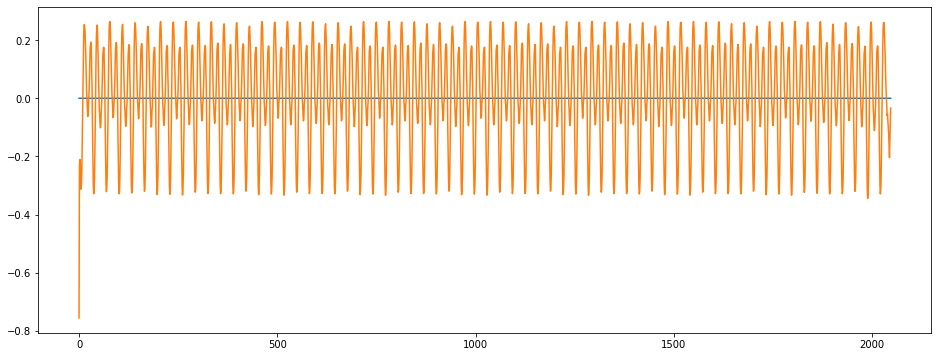

index:  249185
MAE:  0.1438969773835197
n_bunches       2556
bunch_index     1048
bunch_number     770
Name: 2765720, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7234/instability_data/07234_Inst_B1H_Q7_20180929_13h03m14s.h5


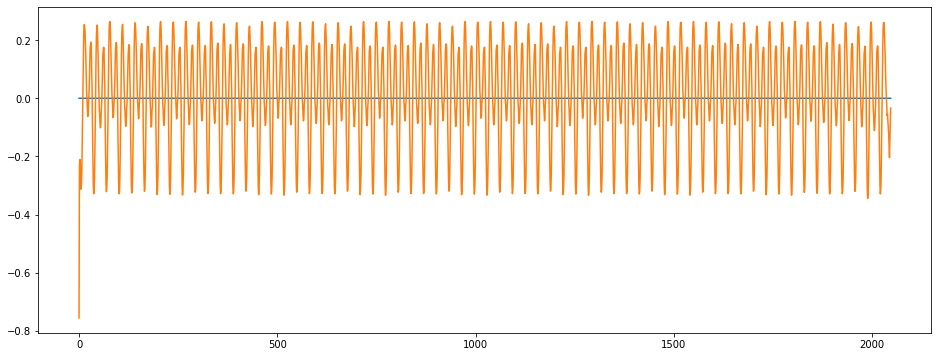

index:  249124
MAE:  0.1438969773835197
n_bunches        987
bunch_index     2387
bunch_number     745
Name: 4631210, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6929/instability_data/06929_Inst_B1H_Q7_20180716_06h51m15s.h5


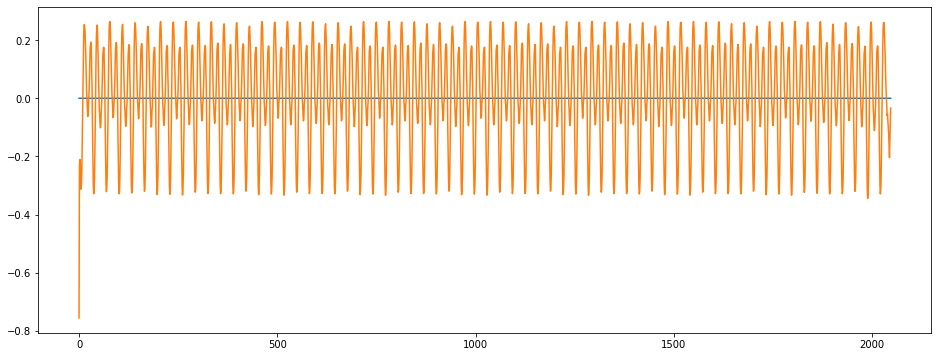

In [27]:
for i in range(1, 11):
    left_most = -i
    left_most_index = max_MAE_indices[left_most]

    print('index: ', left_most_index)
    print("MAE: ", MAE_train[left_most_index])
    # I'm not sure this row is correct
    metadata_row = train_generator.metadata.iloc[left_most_index // 32]
    print(metadata_row[['n_bunches', 'bunch_index', 'bunch_number']])
    print(metadata_row['file'])


    true_signal = train_dataset[left_most_index].squeeze()
    pred_signal = train_pred[left_most_index].squeeze()

    plot_true_pred(true_signal, pred_signal)
    plt.show()

# Signals around the peak

In [28]:
around_peak_indices = np.argsort(np.abs(MAE_train - hist_peak_train))

index:  356335
MAE:  0.7669922966898437
n_bunches        648
bunch_index     2103
bunch_number     392
Name: 9179458, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7483/instability_data/07483_Inst_B1H_Q7_20181129_04h40m14s.h5


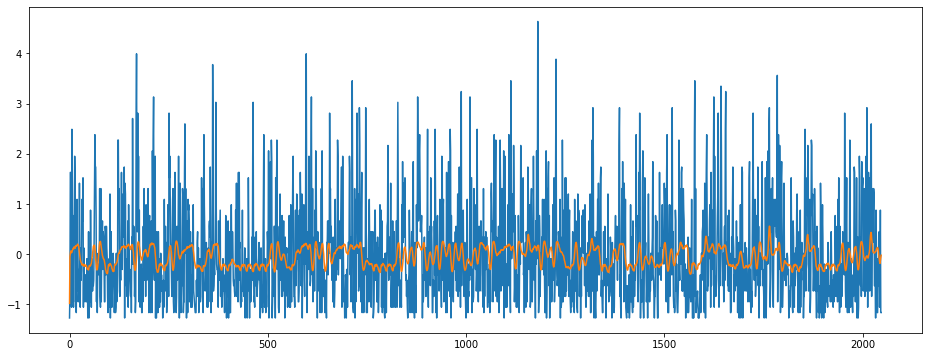

index:  34808
MAE:  0.7669923665438303
n_bunches       396
bunch_index     252
bunch_number    158
Name: 6377926, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7321/instability_data/07321_Inst_B1H_Q7_20181020_08h57m14s.h5


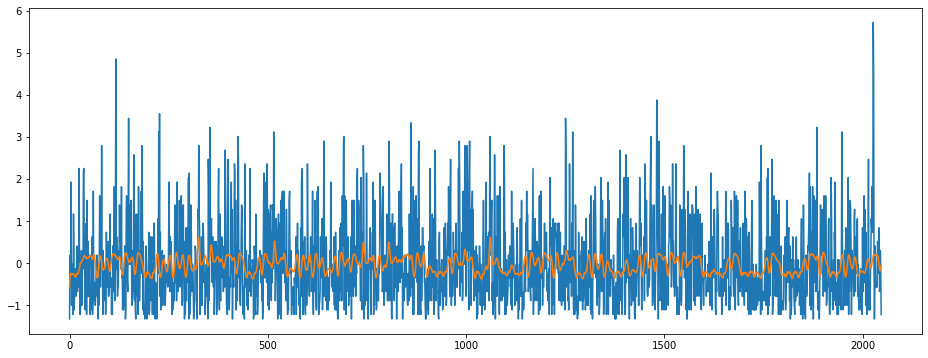

index:  242222
MAE:  0.7669925191821552
n_bunches       2556
bunch_index      347
bunch_number     246
Name: 11074633, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6919/instability_data/06919_Inst_B1H_Q7_20180713_13h51m14s.h5


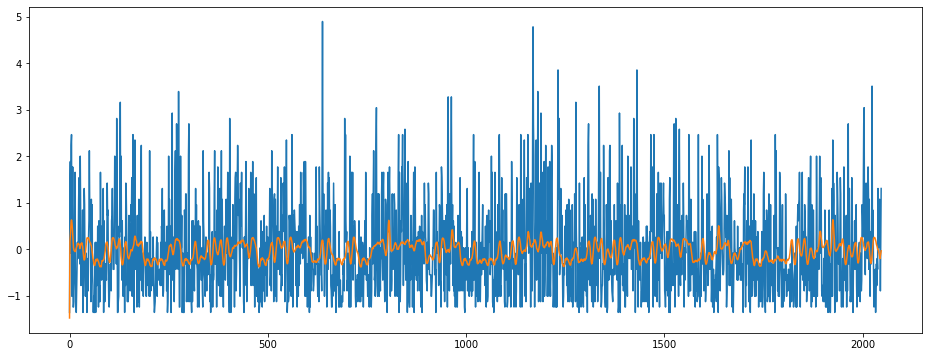

index:  56846
MAE:  0.7669920828569698
n_bunches       2556
bunch_index     2474
bunch_number    1839
Name: 7566876, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7347/instability_data/07347_Inst_B1H_Q7_20181025_11h27m03s.h5


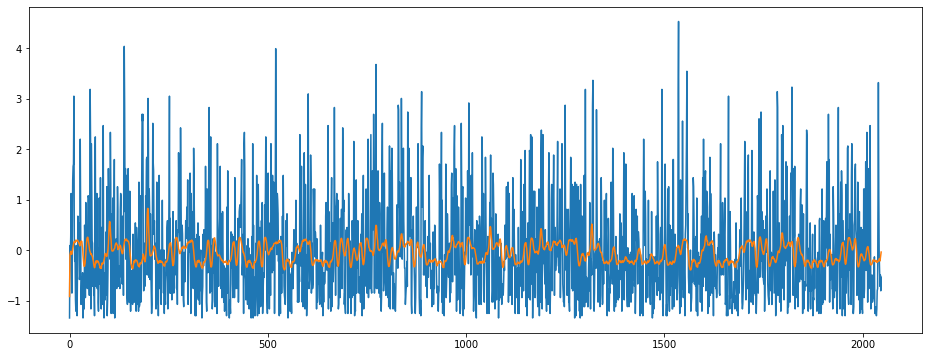

index:  164194
MAE:  0.766992633713987
n_bunches       396
bunch_index     122
bunch_number     66
Name: 1116629, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7043/instability_data/07043_Inst_B1H_Q7_20180811_07h38m32s.h5


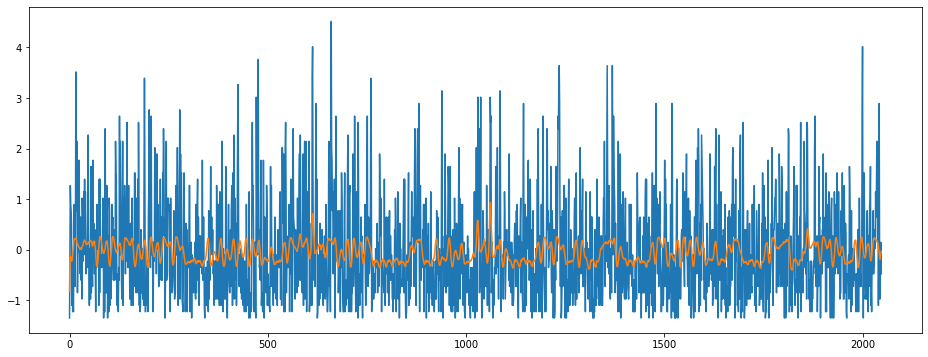

index:  305577
MAE:  0.766992639134827
n_bunches       1227
bunch_index     2062
bunch_number     762
Name: 5742490, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6690/instability_data/06690_Inst_B1H_Q7_20180516_05h21m14s.h5


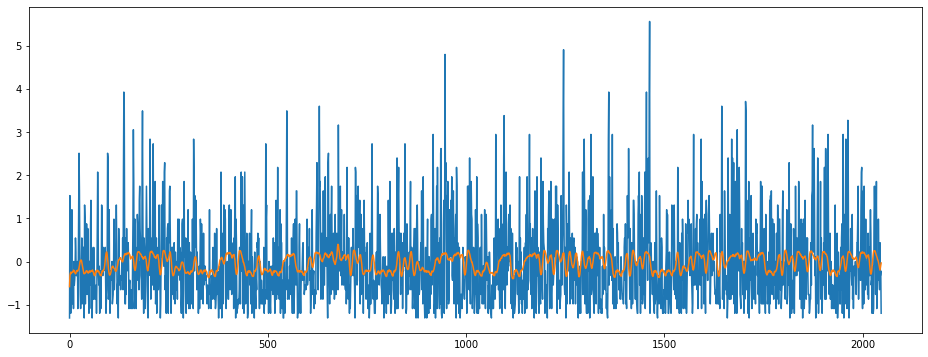

index:  9919
MAE:  0.7669926734258862
n_bunches        780
bunch_index     1052
bunch_number     774
Name: 8969640, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7109/instability_data/07109_Inst_B1H_Q7_20180831_19h44m42s.h5


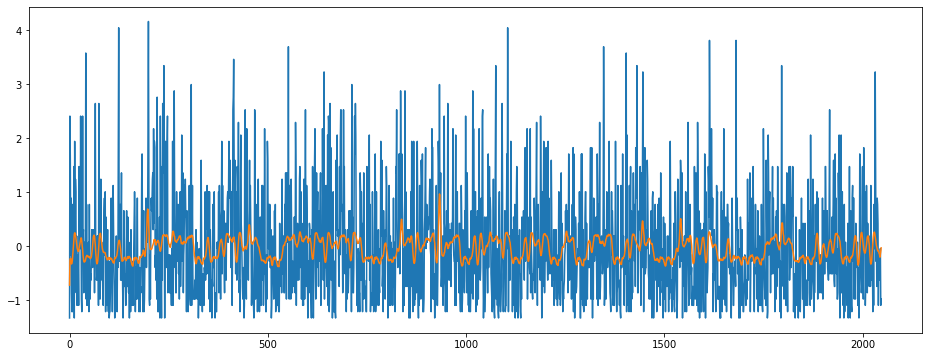

index:  363885
MAE:  0.7669919085093777
n_bunches       1020
bunch_index     1314
bunch_number     958
Name: 9378860, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6457/instability_data/06457_Inst_B1H_Q7_20171203_18h53m15s.h5


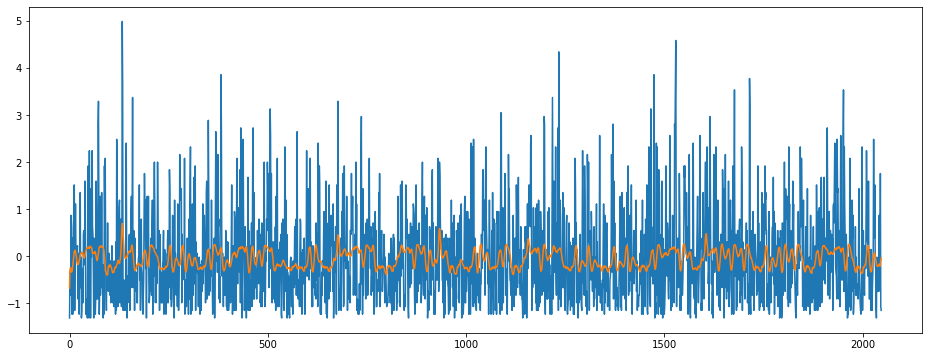

index:  306191
MAE:  0.7669918992669609
n_bunches       2556
bunch_index     2894
bunch_number    2141
Name: 9868643, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7033/instability_data/07033_Inst_B1H_Q7_20180807_14h43m15s.h5


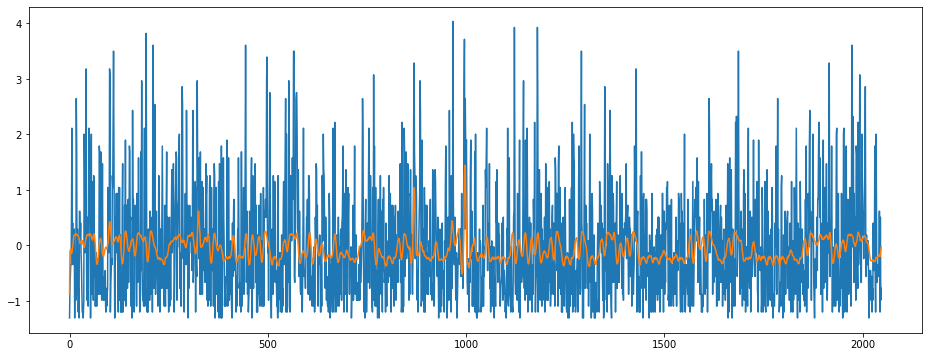

index:  228494
MAE:  0.7669927767349067
n_bunches        648
bunch_index     1715
bunch_number     318
Name: 4830521, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7483/instability_data/07483_Inst_B1H_Q7_20181129_09h15m14s.h5


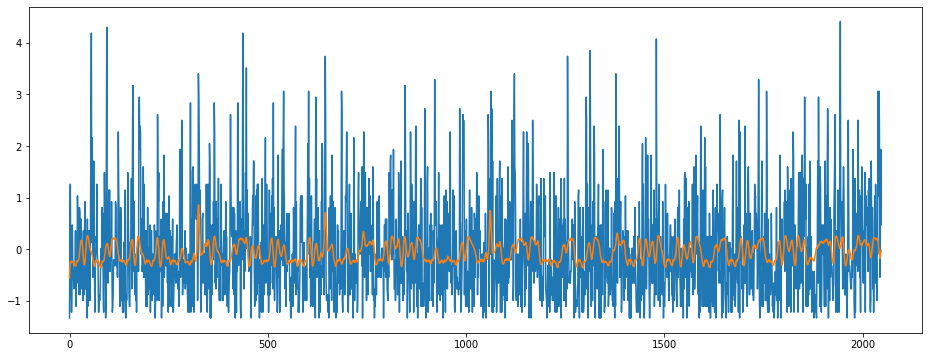

In [29]:
for i in range(10):
    around_peak_index = around_peak_indices[i]

    print('index: ', around_peak_index)
    print("MAE: ", MAE_train[around_peak_index])
    # I'm not sure this row is correct
    metadata_row = train_generator.metadata.iloc[around_peak_index // 32]
    print(metadata_row[['n_bunches', 'bunch_index', 'bunch_number']])
    print(metadata_row['file'])

    true_signal = train_dataset[around_peak_index].squeeze()
    pred_signal = train_pred[around_peak_index].squeeze()

    plot_true_pred(true_signal, pred_signal)
    plt.show()

# around a point

In [30]:
around_point_indices = np.argsort(np.abs(MAE_train - 0.6))

index:  354393
MAE:  0.5998667215072728
n_bunches       2556
bunch_index     2951
bunch_number    2191
Name: 7988179, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7033/instability_data/07033_Inst_B1H_Q7_20180807_07h02m15s.h5


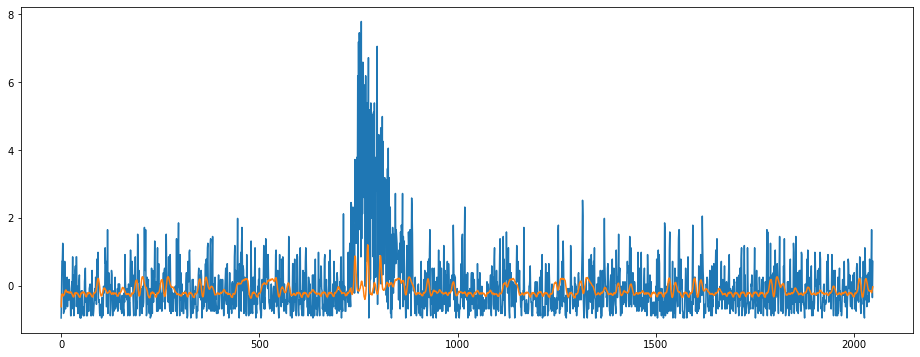

index:  25193
MAE:  0.6003381482706792
n_bunches       636
bunch_index     247
bunch_number    141
Name: 10043092, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6761/instability_data/06761_Inst_B1H_Q7_20180605_19h09m49s.h5


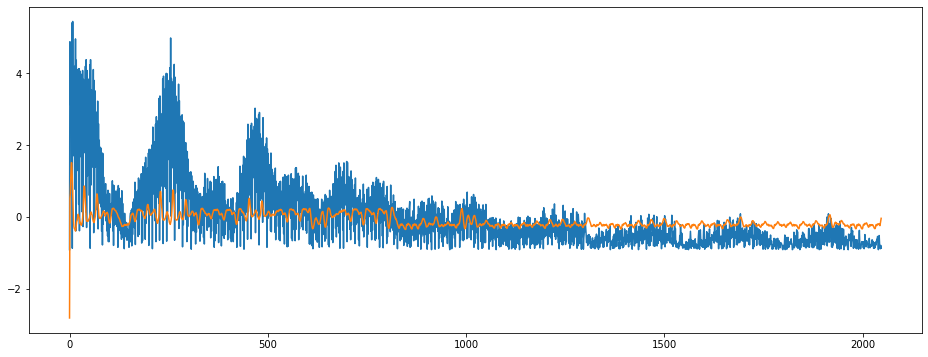

index:  99043
MAE:  0.5990364446394854
n_bunches        408
bunch_index     1035
bunch_number     118
Name: 3826275, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6436/instability_data/06436_Inst_B1H_Q7_20171130_01h35m14s.h5


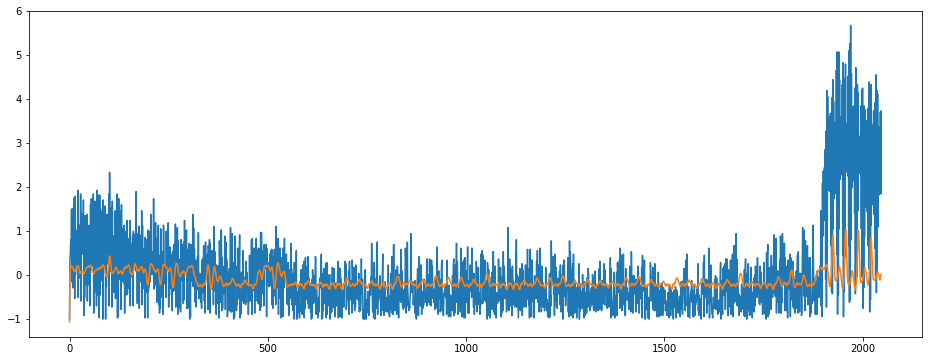

index:  156150
MAE:  0.5973903964267533
n_bunches        987
bunch_index     2952
bunch_number     834
Name: 1745803, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6929/instability_data/06929_Inst_B1H_Q7_20180716_04h50m14s.h5


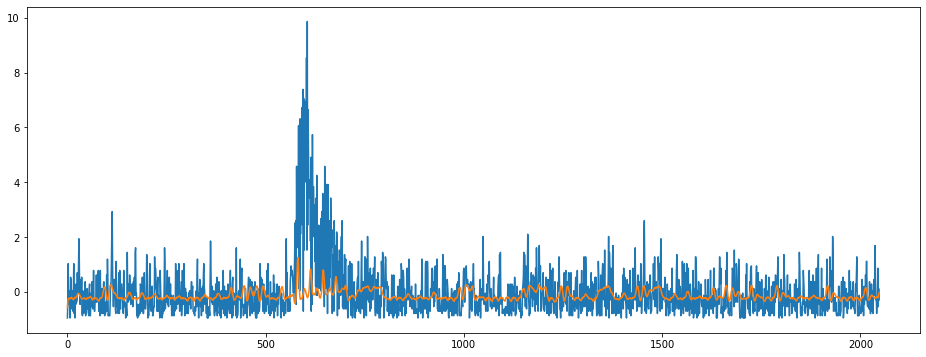

index:  267834
MAE:  0.5971418725977016
n_bunches       108
bunch_index      72
bunch_number     23
Name: 9418753, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7317/instability_data/07317_Inst_B1H_Q7_20181019_07h25m22s.h5


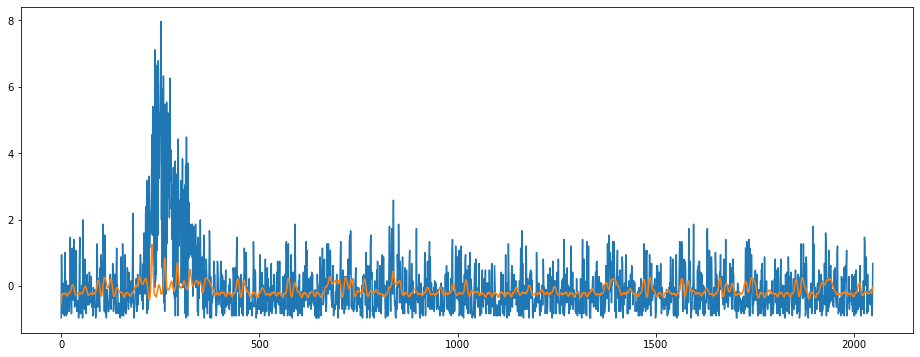

index:  260853
MAE:  0.5970894940948448
n_bunches       987
bunch_index     524
bunch_number    183
Name: 9709388, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6618/instability_data/06618_Inst_B1H_Q7_20180428_05h27m14s.h5


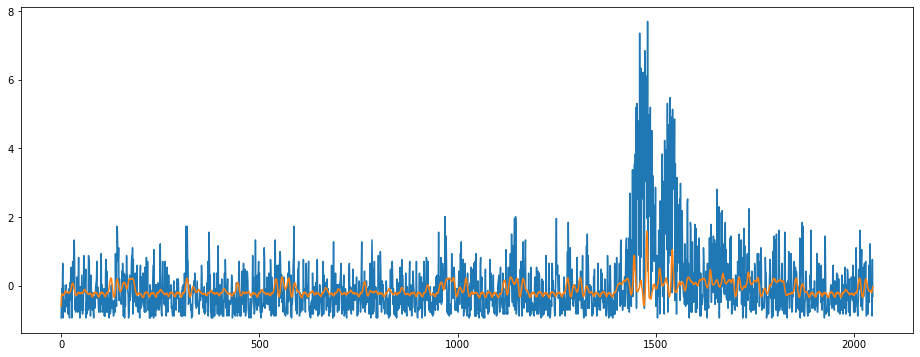

index:  38544
MAE:  0.6030448179316148
n_bunches       252
bunch_index     198
bunch_number    111
Name: 1191571, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7384/instability_data/07384_Inst_B1H_Q7_20181029_02h46m03s.h5


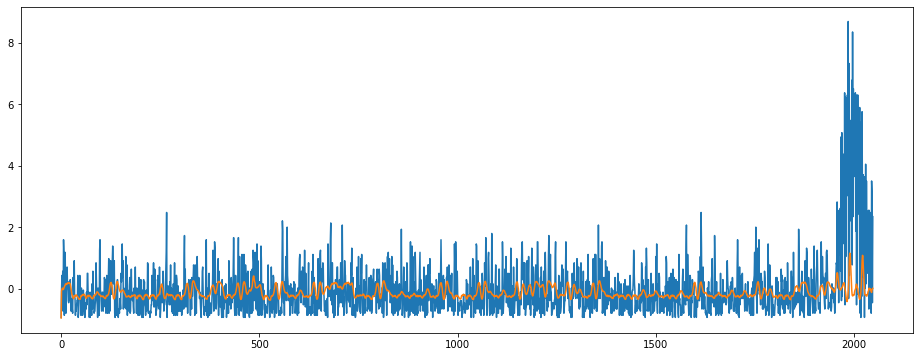

index:  56966
MAE:  0.6065912912917845
n_bunches       1836
bunch_index     1149
bunch_number     600
Name: 356603, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6271/instability_data/06271_Inst_B1H_Q7_20171004_11h54m41s.h5


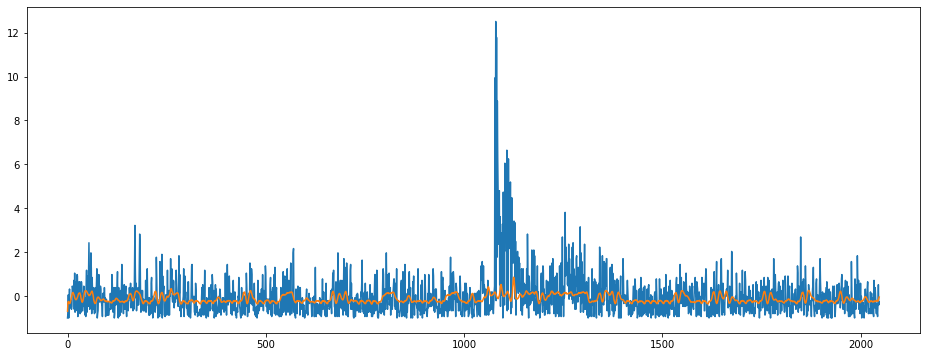

index:  12250
MAE:  0.6072920473700462
n_bunches       648
bunch_index     575
bunch_number    107
Name: 8403881, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7448/instability_data/07448_Inst_B1H_Q7_20181116_08h22m21s.h5


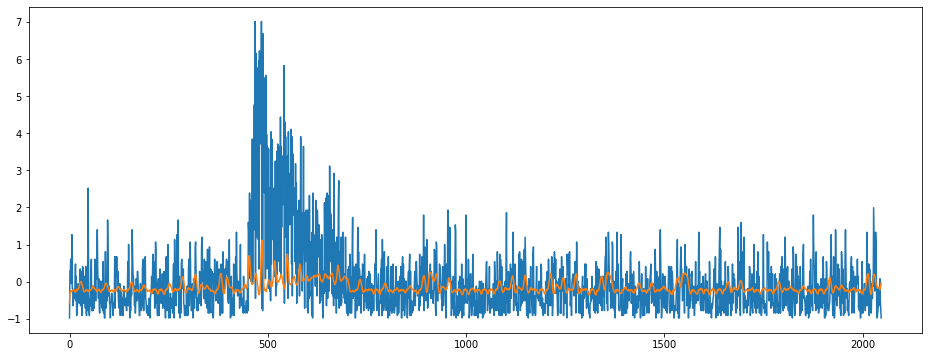

index:  264148
MAE:  0.5917372037960194
n_bunches       2556
bunch_index     2807
bunch_number    2085
Name: 3184835, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7035/instability_data/07035_Inst_B1H_Q7_20180807_17h54m15s.h5


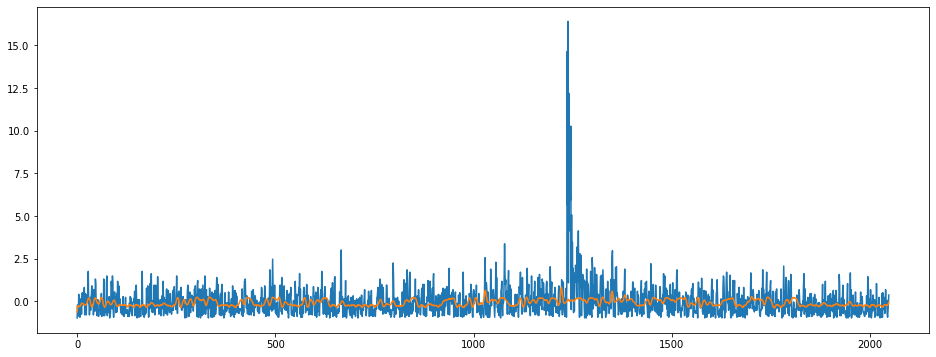

In [31]:
for i in range(10):
    around_point_index = around_point_indices[i]

    print('index: ', around_point_index)
    print("MAE: ", MAE_train[around_point_index])
    # I'm not sure this row is correct
    metadata_row = train_generator.metadata.iloc[around_point_index // 32]
    print(metadata_row[['n_bunches', 'bunch_index', 'bunch_number']])
    print(metadata_row['file'])

    true_signal = train_dataset[around_point_index].squeeze()
    pred_signal = train_pred[around_point_index].squeeze()

    plot_true_pred(true_signal, pred_signal)
    plt.show()

# latent space encoding

In [32]:
import keras

In [33]:
encoding_model = keras.Model(inputs=model.input,
                                       outputs=model.get_layer('conv1d_3').output)

In [34]:
encoding_output = encoding_model(train_dataset[max_MAE_indices[-1]][None, :])
encoding_output.shape

TensorShape([1, 8, 8])

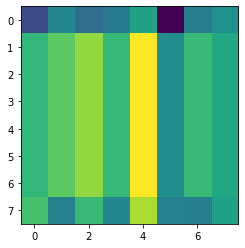

In [35]:
plt.imshow(np.array(encoding_output).squeeze())

# Latent space encoding of nominal signals

index:  9768
MAE:  0.1438969773835197
n_bunches       1004
bunch_index      258
bunch_number     132
Name: 7089476, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6417/instability_data/06417_Inst_B1H_Q7_20171126_01h53m55s.h5


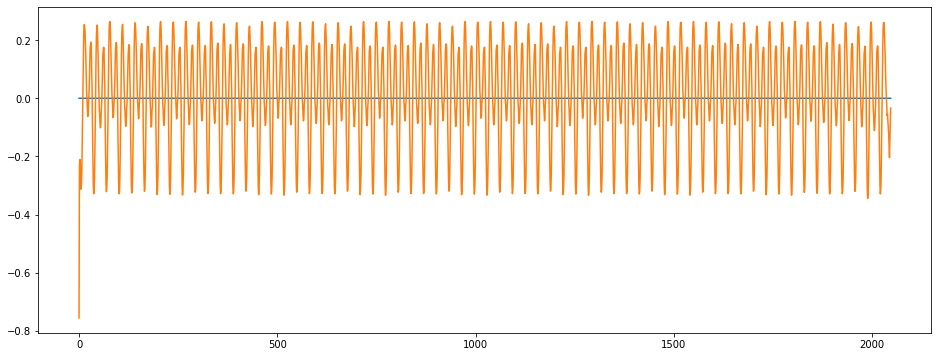

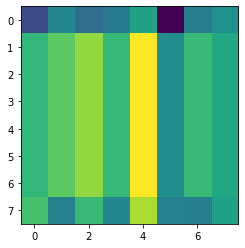

index:  249392
MAE:  0.1438969773835197
n_bunches       1452
bunch_index     1700
bunch_number     719
Name: 8375249, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6892/instability_data/06892_Inst_B1H_Q7_20180707_05h31m14s.h5


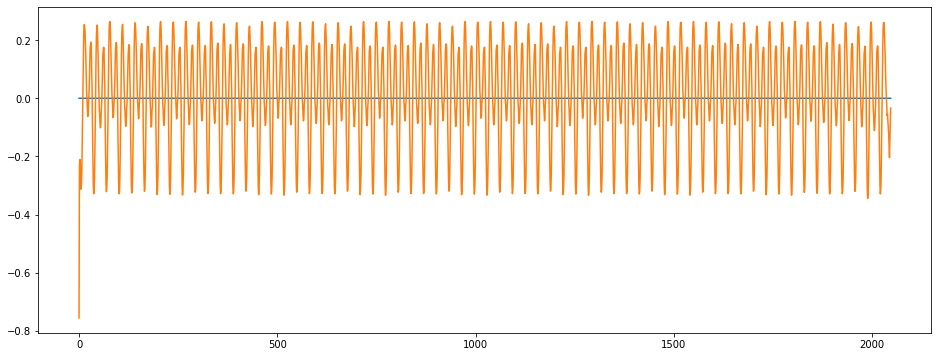

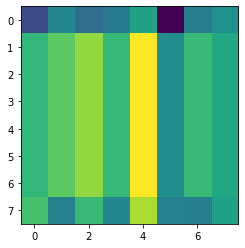

index:  145205
MAE:  0.1438969773835197
n_bunches       2460
bunch_index     1745
bunch_number    1284
Name: 9306359, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6640/instability_data/06640_Inst_B1H_Q7_20180504_09h59m52s.h5


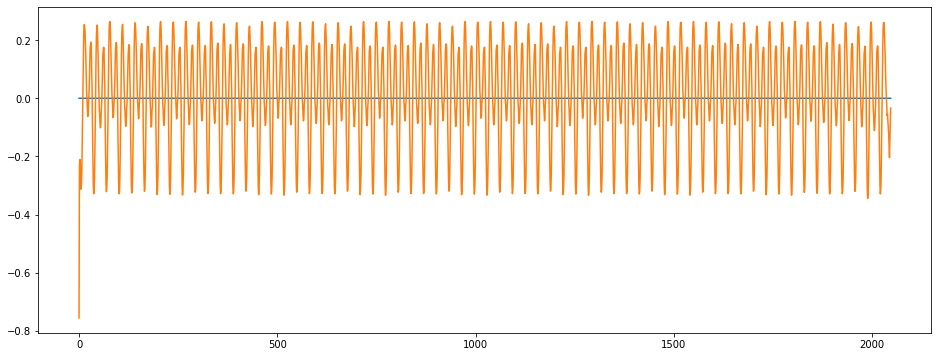

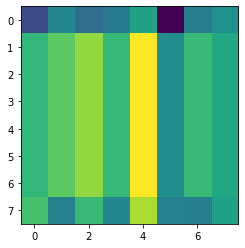

index:  249364
MAE:  0.1438969773835197
n_bunches       1068
bunch_index     1395
bunch_number    1027
Name: 6404428, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6776/instability_data/06776_Inst_B1H_Q7_20180611_16h59m57s.h5


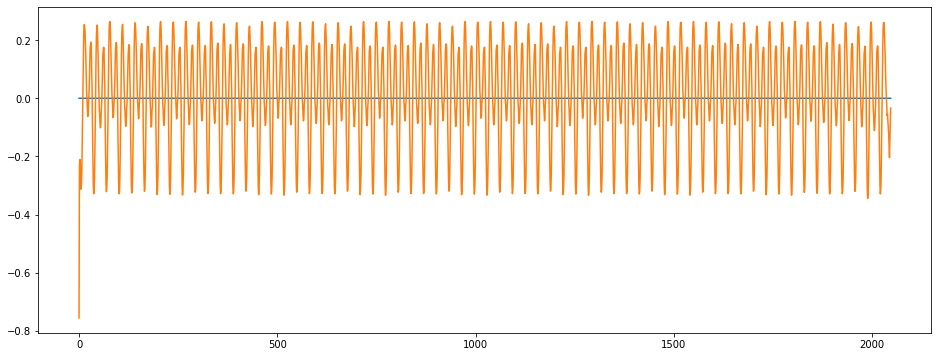

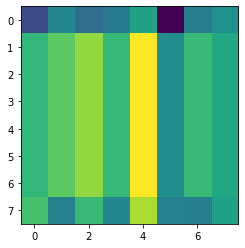

index:  249324
MAE:  0.1438969773835197
n_bunches        924
bunch_index     1224
bunch_number     901
Name: 5993112, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7040/instability_data/07040_Inst_B1H_Q7_20180809_19h15m36s.h5


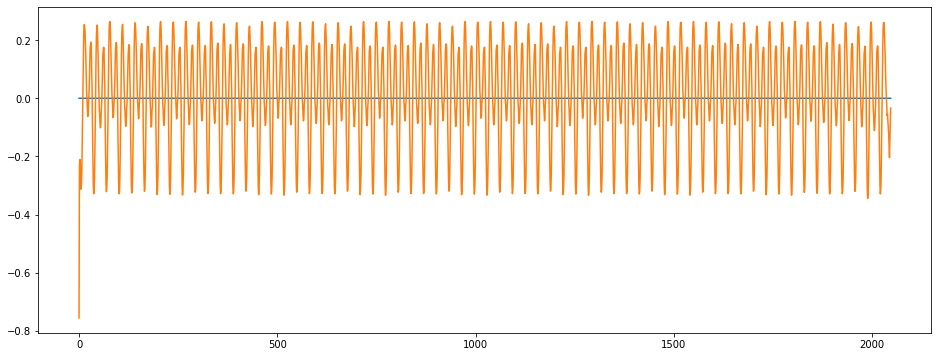

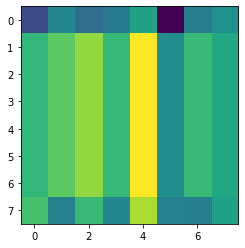

index:  350775
MAE:  0.1438969773835197
n_bunches       108
bunch_index     167
bunch_number     79
Name: 3475123, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6268/instability_data/06268_Inst_B1H_Q7_20171003_12h23m16s.h5


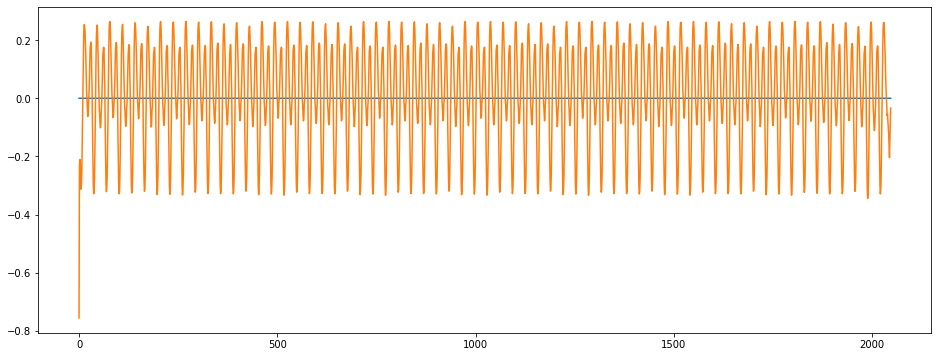

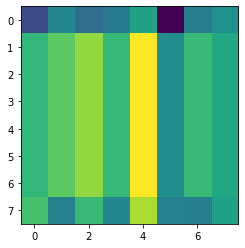

index:  382728
MAE:  0.1438969773835197
n_bunches       1227
bunch_index      506
bunch_number     225
Name: 9361265, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6624/instability_data/06624_Inst_B1H_Q7_20180430_04h44m15s.h5


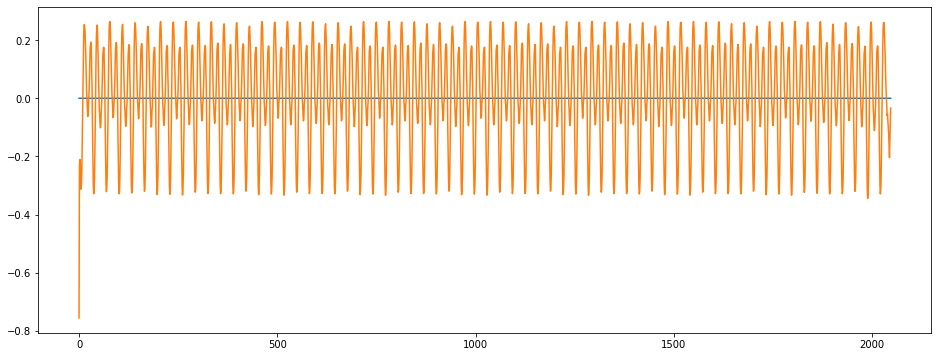

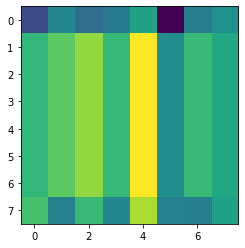

index:  73460
MAE:  0.1438969773835197
n_bunches       1452
bunch_index     3362
bunch_number    1430
Name: 11556607, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6890/instability_data/06890_Inst_B1H_Q7_20180705_16h51m15s.h5


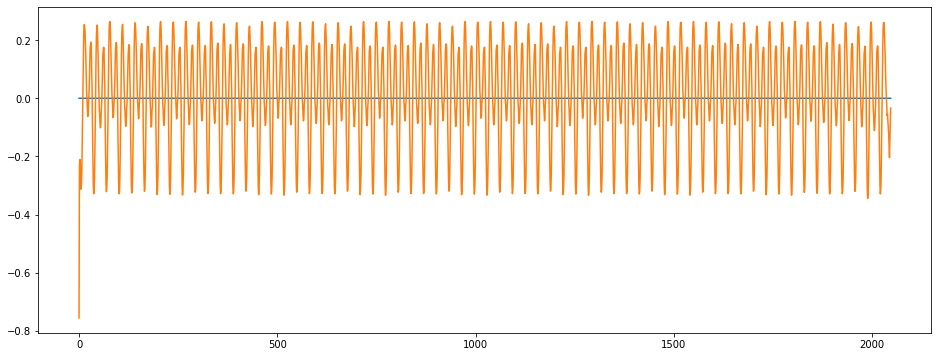

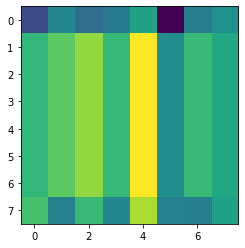

index:  249185
MAE:  0.1438969773835197
n_bunches       2556
bunch_index     1048
bunch_number     770
Name: 2765720, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7234/instability_data/07234_Inst_B1H_Q7_20180929_13h03m14s.h5


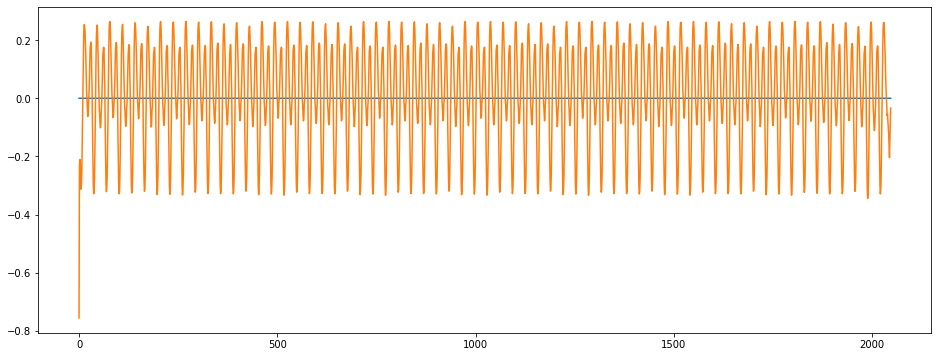

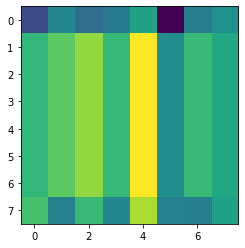

index:  249124
MAE:  0.1438969773835197
n_bunches        987
bunch_index     2387
bunch_number     745
Name: 4631210, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6929/instability_data/06929_Inst_B1H_Q7_20180716_06h51m15s.h5


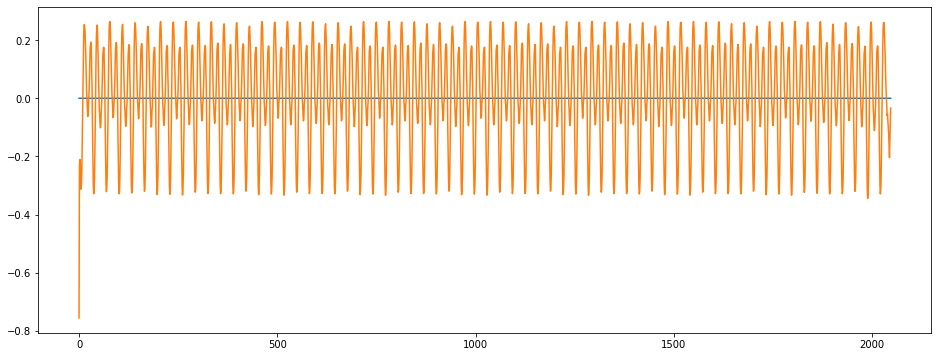

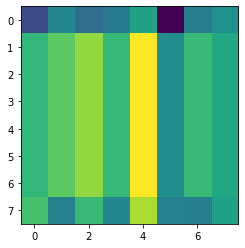

In [36]:
for i in range(1, 11):
    left_most = -i
    left_most_index = max_MAE_indices[left_most]
    
    encoding_output = encoding_model(train_dataset[max_MAE_indices[left_most]][None, :])

    print('index: ', left_most_index)
    print("MAE: ", MAE_train[left_most_index])
    # I'm not sure this row is correct
    metadata_row = train_generator.metadata.iloc[left_most_index // 32]
    print(metadata_row[['n_bunches', 'bunch_index', 'bunch_number']])
    print(metadata_row['file'])


    true_signal = train_dataset[left_most_index].squeeze()
    pred_signal = train_pred[left_most_index].squeeze()

    plot_true_pred(true_signal, pred_signal)
    plt.show()
    plt.imshow(np.array(encoding_output).squeeze())
    plt.show()

# Latent space encoding of anomalous signals

index:  359543
MAE:  0.8769503158878094
n_bunches       924
bunch_index     864
bunch_number    631
Name: 3754799, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6965/instability_data/06965_Inst_B1H_Q7_20180723_22h12m15s.h5


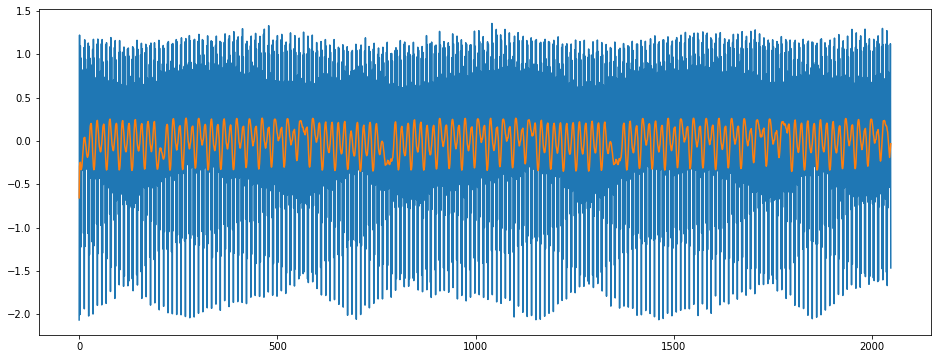

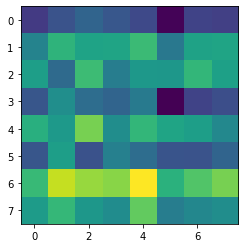

index:  353065
MAE:  0.876706532558057
n_bunches       468
bunch_index     828
bunch_number    398
Name: 577373, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7365/instability_data/07365_Inst_B1H_Q7_20181026_22h04m15s.h5


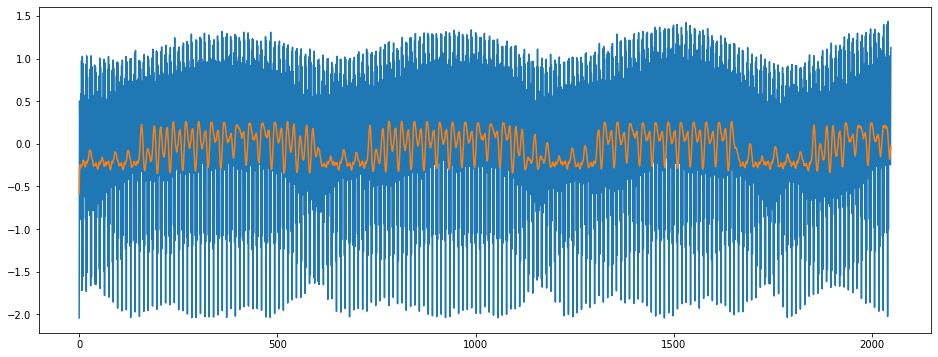

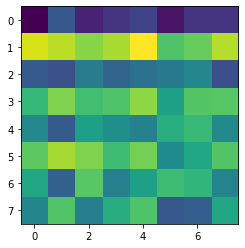

index:  360233
MAE:  0.8762501609408676
n_bunches       924
bunch_index     693
bunch_number    502
Name: 2966699, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7087/instability_data/07087_Inst_B1H_Q7_20180825_13h09m08s.h5


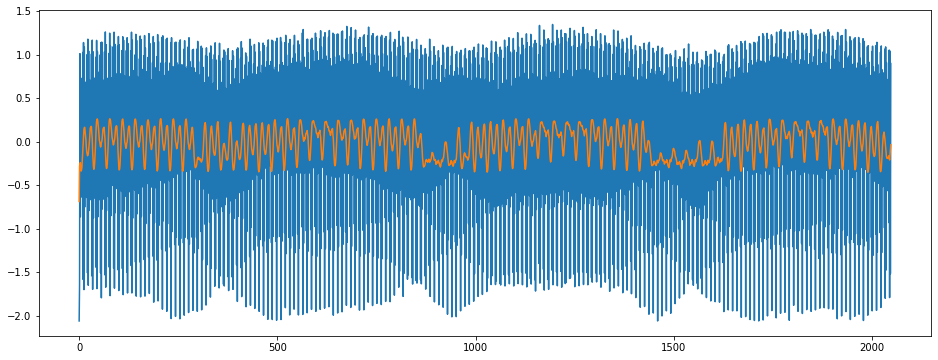

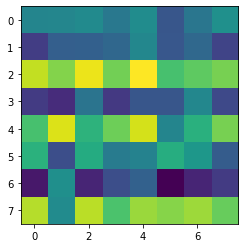

index:  222619
MAE:  0.8761783550822824
n_bunches       1868
bunch_index     2847
bunch_number    1522
Name: 10205405, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6349/instability_data/06349_Inst_B1H_Q7_20171031_06h35m14s.h5


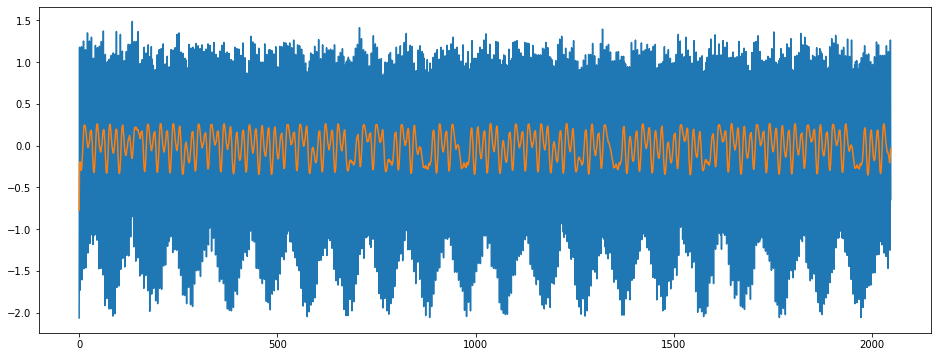

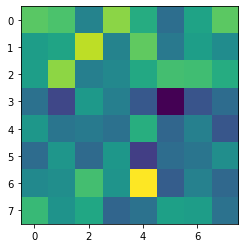

index:  306468
MAE:  0.8749065172220926
n_bunches       1212
bunch_index     1318
bunch_number     964
Name: 930646, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7145/instability_data/07145_Inst_B1H_Q7_20180910_04h30m11s.h5


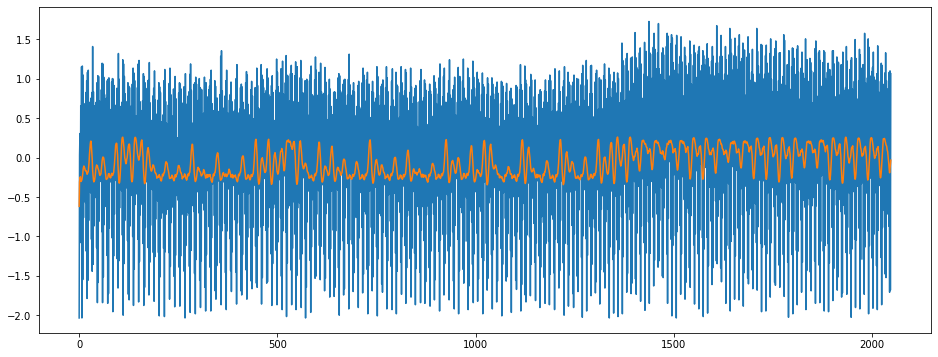

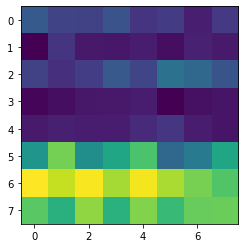

index:  229130
MAE:  0.873760366799246
n_bunches       1358
bunch_index     3348
bunch_number    1322
Name: 4211542, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6239/instability_data/06239_Inst_B1H_Q7_20170924_04h52m37s.h5


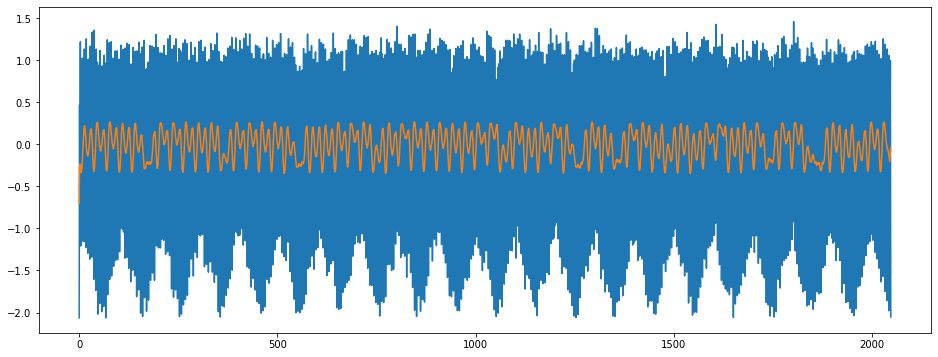

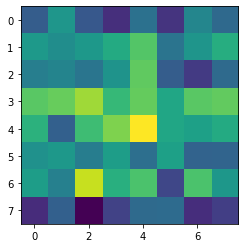

index:  227668
MAE:  0.8735512265902985
n_bunches       1227
bunch_index     1638
bunch_number     609
Name: 4463784, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6690/instability_data/06690_Inst_B1H_Q7_20180516_04h00m14s.h5


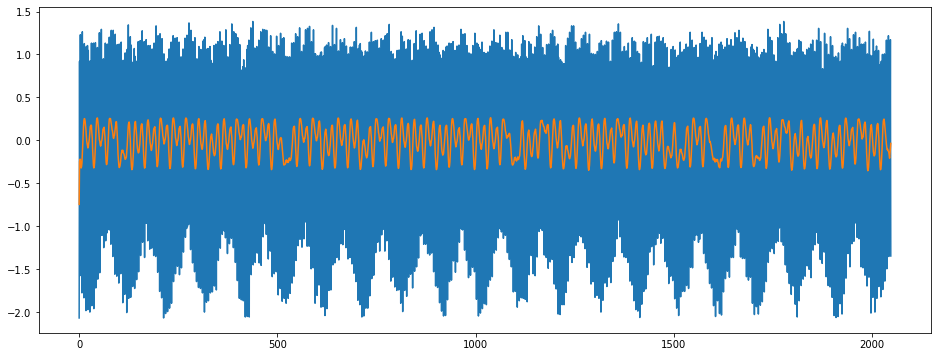

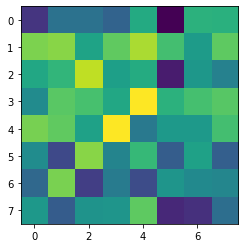

index:  268943
MAE:  0.8734665511256297
n_bunches       2556
bunch_index      359
bunch_number     239
Name: 1616650, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6663/instability_data/06663_Inst_B1H_Q7_20180510_15h13m15s.h5


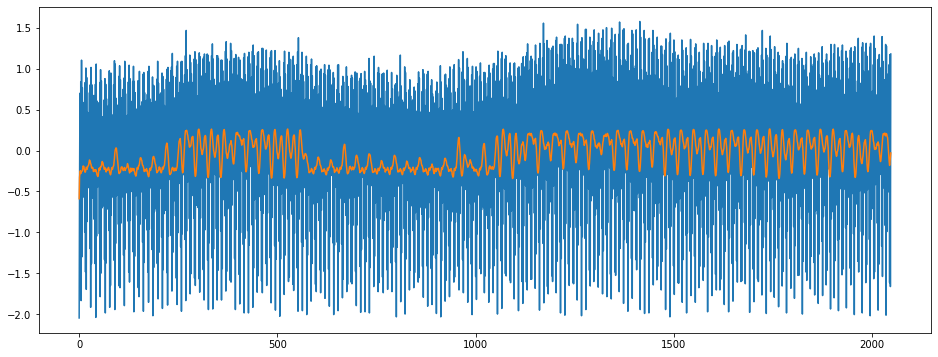

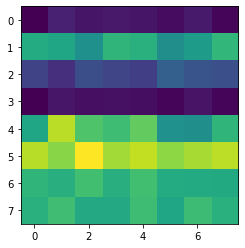

index:  98587
MAE:  0.8718596755364011
n_bunches       1068
bunch_index     1226
bunch_number     884
Name: 10744574, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6748/instability_data/06748_Inst_B1H_Q7_20180601_01h09m23s.h5


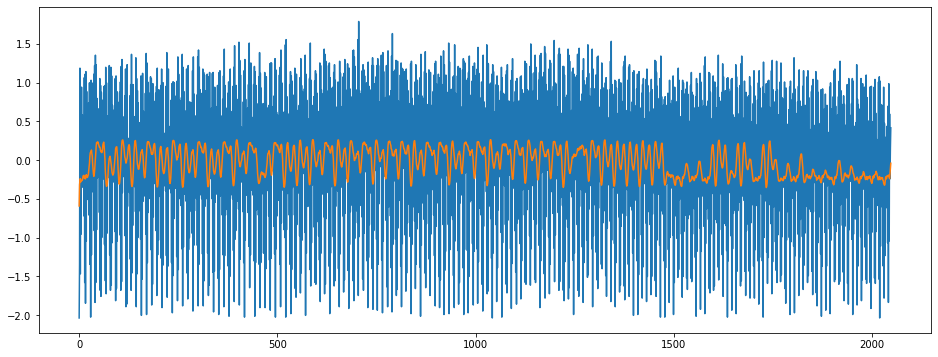

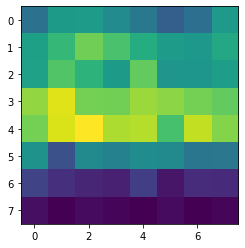

index:  175952
MAE:  0.8711430208191309
n_bunches       1868
bunch_index     3314
bunch_number    1785
Name: 8506935, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6364/instability_data/06364_Inst_B1H_Q7_20171107_06h20m15s.h5


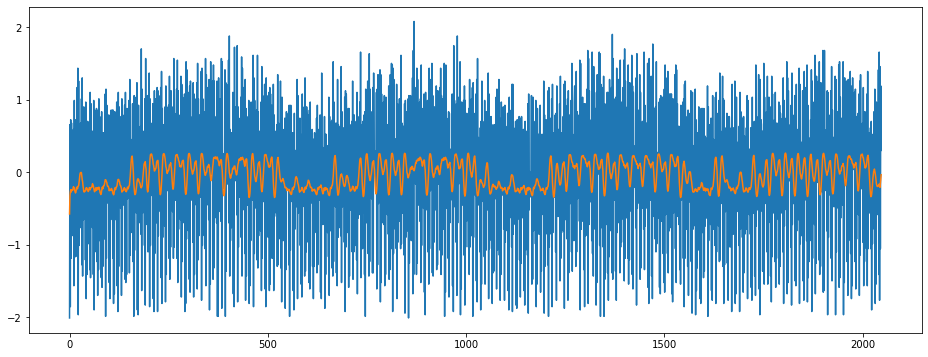

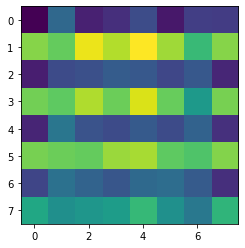

index:  297762
MAE:  0.8699475605227114
n_bunches        596
bunch_index     1803
bunch_number     326
Name: 5135544, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7442/instability_data/07442_Inst_B1H_Q7_20181113_19h10m15s.h5


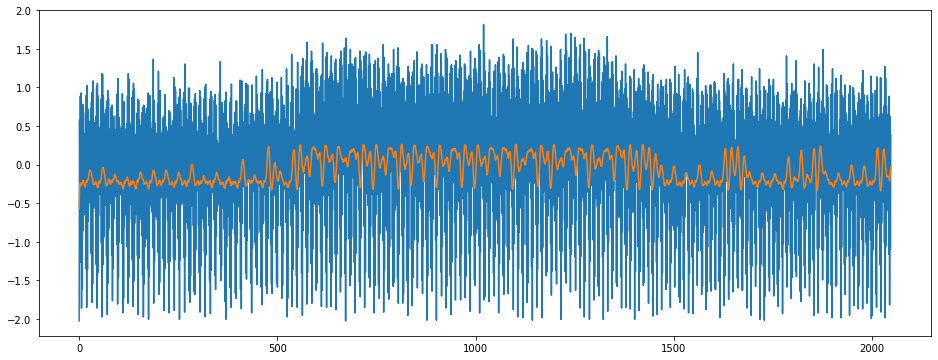

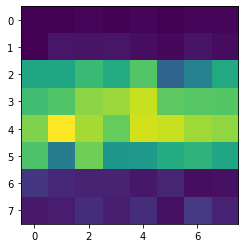

index:  374338
MAE:  0.8693500987328929
n_bunches       458
bunch_index     263
bunch_number     31
Name: 4812922, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6849/instability_data/06849_Inst_B1H_Q7_20180626_18h09m46s.h5


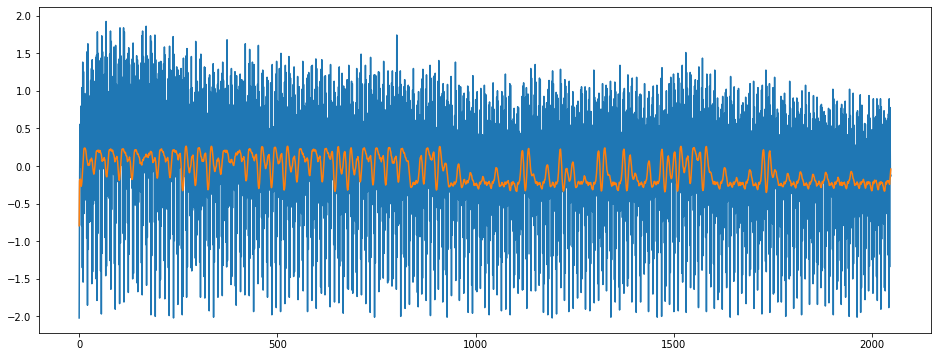

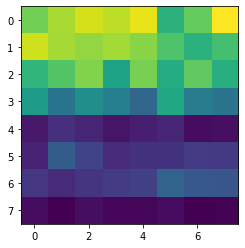

index:  104969
MAE:  0.8692690071090751
n_bunches       924
bunch_index     273
bunch_number    179
Name: 8427423, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6911/instability_data/06911_Inst_B1H_Q7_20180711_10h03m14s.h5


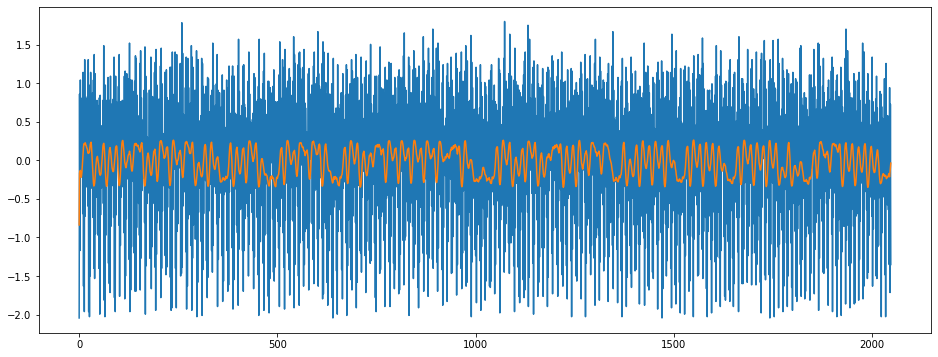

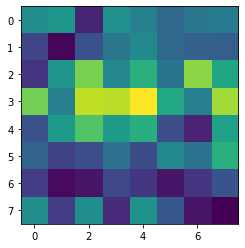

index:  296315
MAE:  0.8692263082378101
n_bunches       396
bunch_index     136
bunch_number     80
Name: 6541661, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6786/instability_data/06786_Inst_B1H_Q7_20180613_15h26m53s.h5


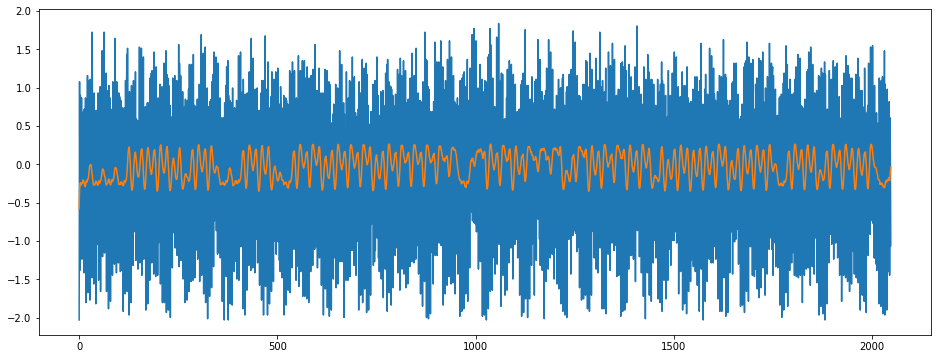

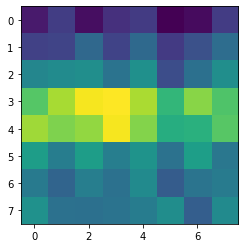

index:  296489
MAE:  0.8690080489829433
n_bunches       2556
bunch_index     3350
bunch_number    2481
Name: 8088189, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6700/instability_data/06700_Inst_B1H_Q7_20180519_04h45m14s.h5


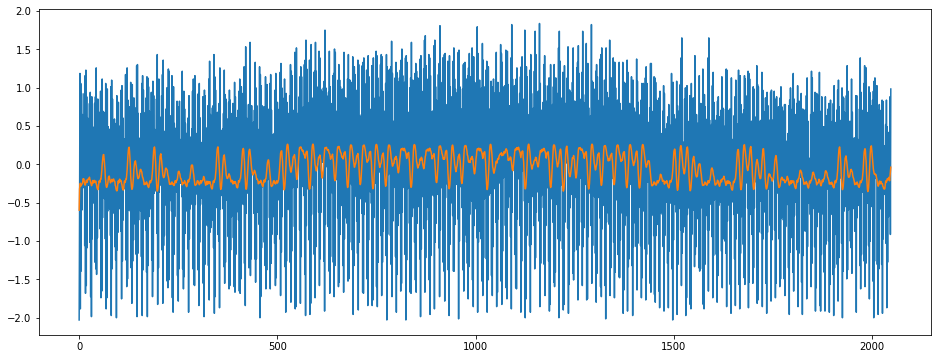

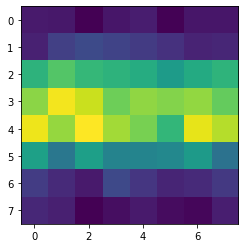

index:  302353
MAE:  0.8689332100848648
n_bunches        40
bunch_index     588
bunch_number     24
Name: 9963116, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7407/instability_data/07407_Inst_B1H_Q7_20181105_05h04m41s.h5


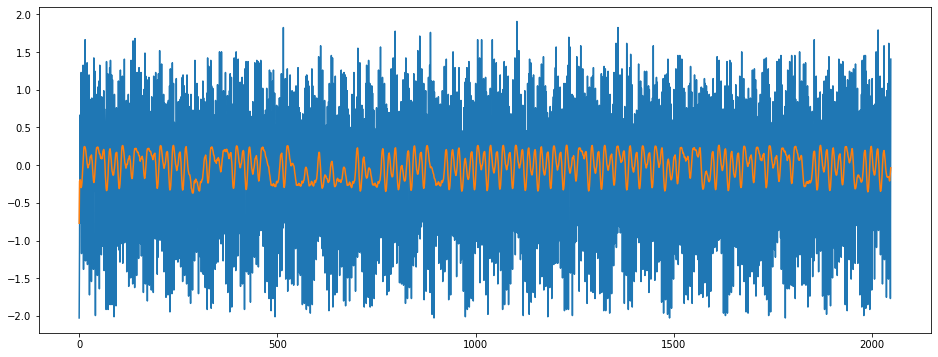

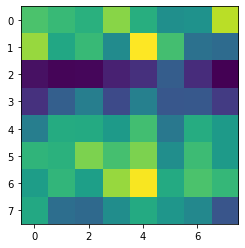

index:  297881
MAE:  0.8683849479957017
n_bunches       2556
bunch_index      102
bunch_number      53
Name: 9237976, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7310/instability_data/07310_Inst_B1H_Q7_20181017_08h08m49s.h5


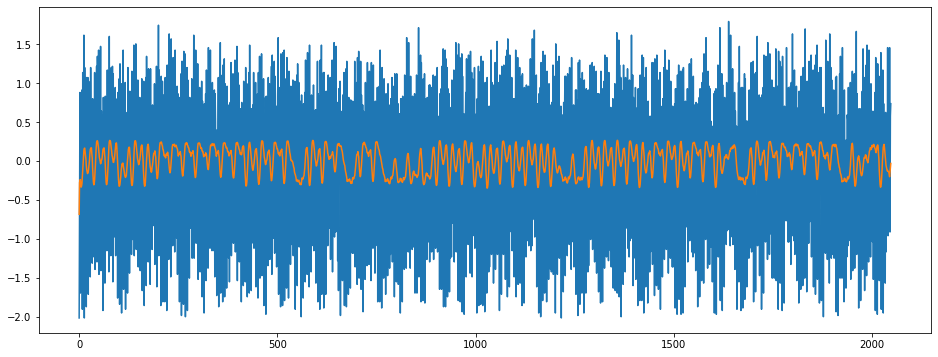

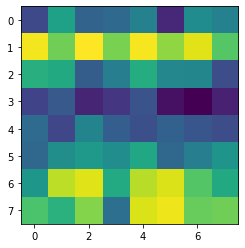

index:  300854
MAE:  0.8682267760660785
n_bunches       1212
bunch_index      100
bunch_number      51
Name: 11087570, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6918/instability_data/06918_Inst_B1H_Q7_20180713_02h01m31s.h5


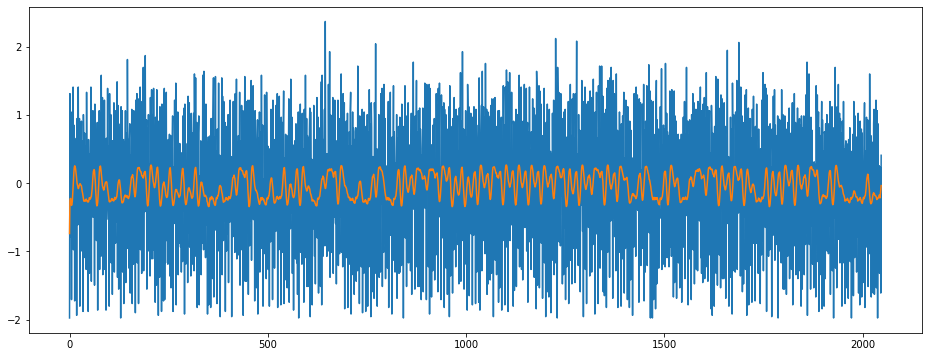

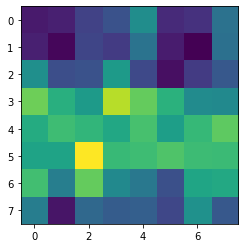

index:  36545
MAE:  0.8680933019084527
n_bunches       1380
bunch_index     1449
bunch_number    1166
Name: 3737909, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6600/instability_data/06600_Inst_B1H_Q7_20180423_13h36m39s.h5


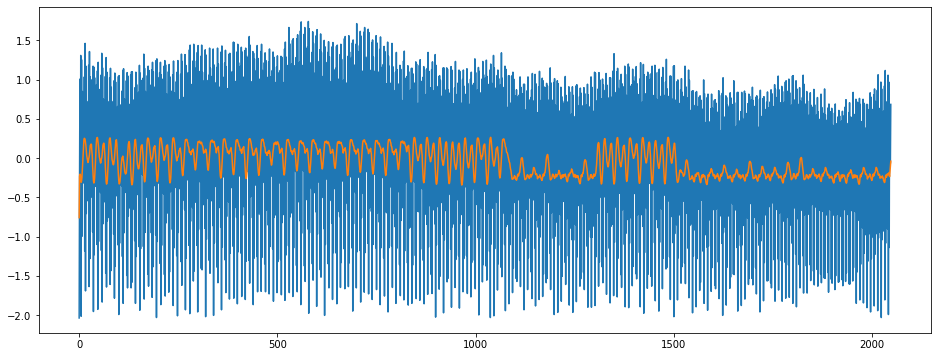

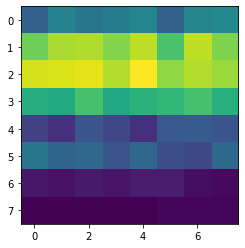

index:  251935
MAE:  0.8680535149225013
n_bunches       418
bunch_index     809
bunch_number    167
Name: 2394744, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7486/instability_data/07486_Inst_B1H_Q7_20181130_08h19m50s.h5


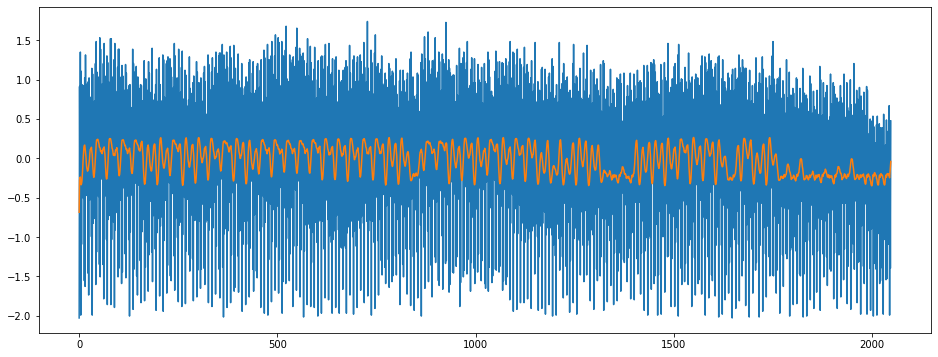

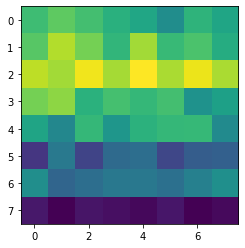

index:  265850
MAE:  0.8677820300432056
n_bunches       876
bunch_index     640
bunch_number    138
Name: 3149227, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6788/instability_data/06788_Inst_B1H_Q7_20180613_22h16m14s.h5


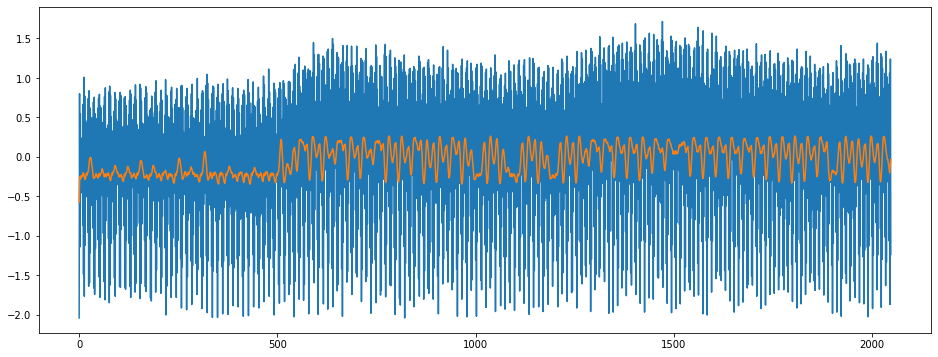

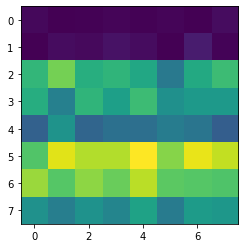

index:  244495
MAE:  0.8674350494067089
n_bunches       1212
bunch_index      958
bunch_number     687
Name: 4682567, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6924/instability_data/06924_Inst_B1H_Q7_20180715_08h19m29s.h5


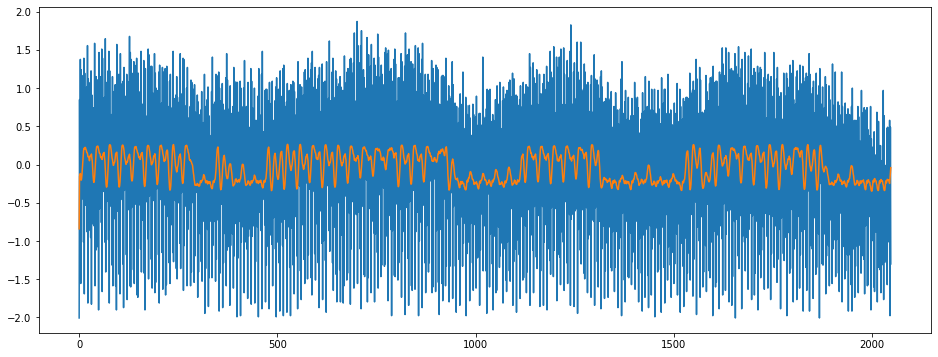

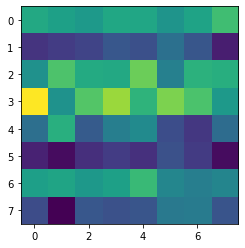

index:  176431
MAE:  0.8674154878249795
n_bunches       1868
bunch_index      594
bunch_number     314
Name: 3234821, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6364/instability_data/06364_Inst_B1H_Q7_20171106_16h35m15s.h5


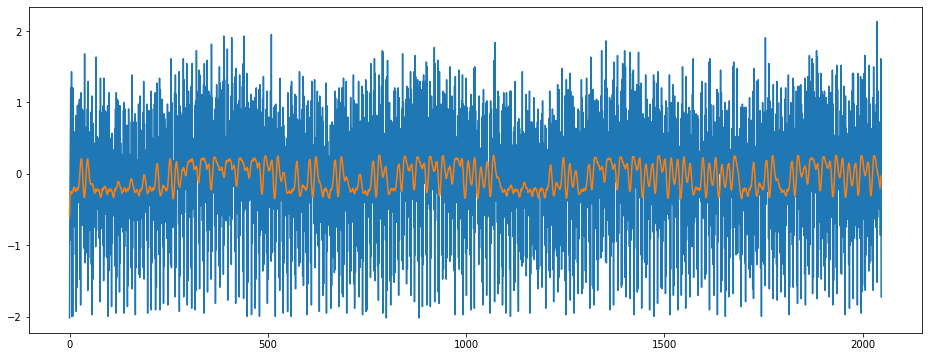

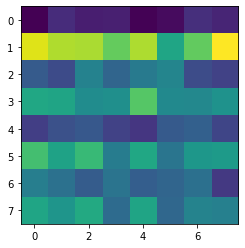

index:  304115
MAE:  0.8670523573224975
n_bunches       1868
bunch_index     2164
bunch_number    1160
Name: 8611843, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6346/instability_data/06346_Inst_B1H_Q7_20171030_01h23m15s.h5


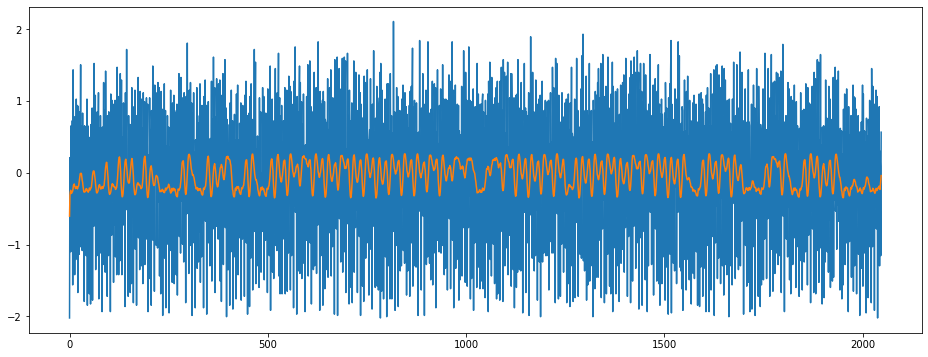

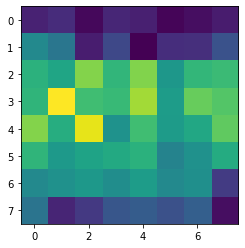

index:  177911
MAE:  0.8669048631431825
n_bunches       1836
bunch_index     1575
bunch_number     837
Name: 1532024, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6272/instability_data/06272_Inst_B1H_Q7_20171005_12h07m13s.h5


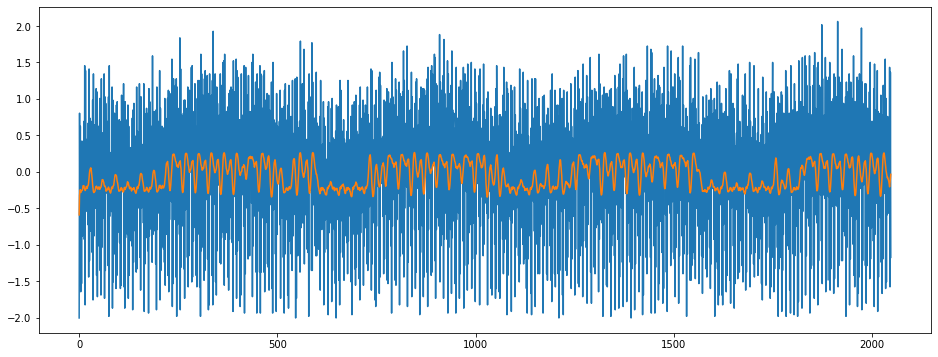

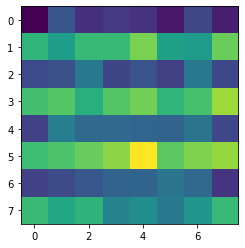

index:  177974
MAE:  0.8666162292478417
n_bunches       1836
bunch_index     1918
bunch_number    1017
Name: 8326151, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6266/instability_data/06266_Inst_B1H_Q7_20171003_04h21m14s.h5


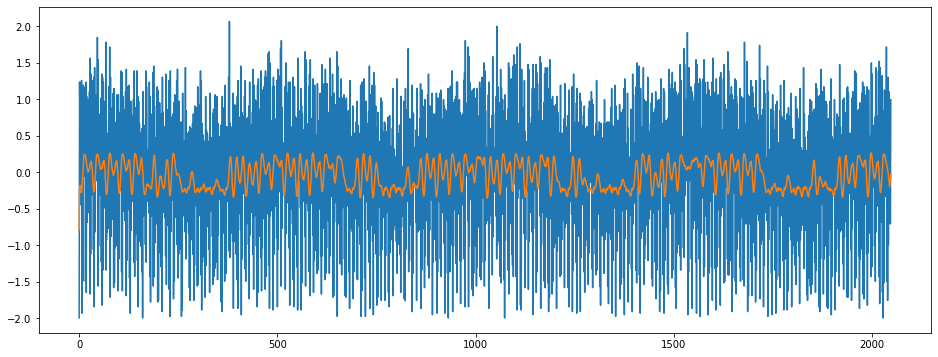

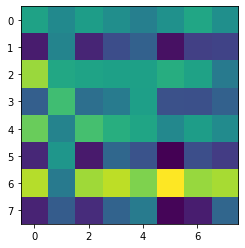

index:  174269
MAE:  0.8664405968728732
n_bunches       1868
bunch_index     1822
bunch_number     973
Name: 5807723, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6364/instability_data/06364_Inst_B1H_Q7_20171107_04h34m14s.h5


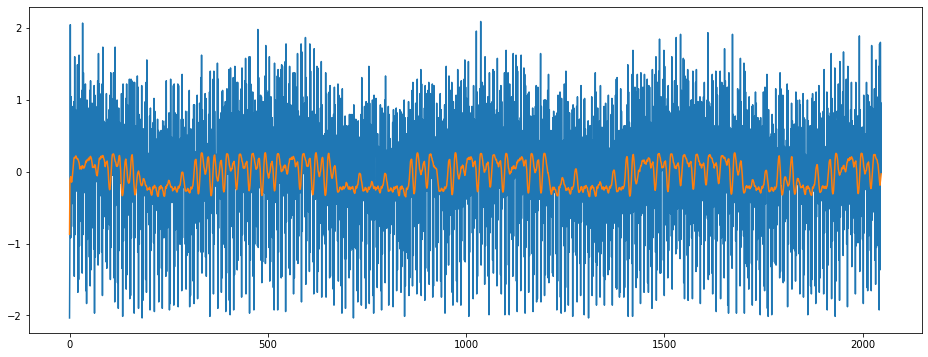

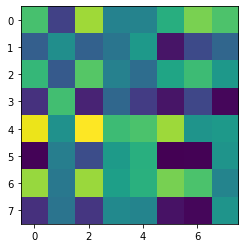

index:  310414
MAE:  0.8660623875011692
n_bunches       110
bunch_index     327
bunch_number     41
Name: 5145962, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6216/instability_data/06216_Inst_B1H_Q7_20170917_03h19m14s.h5


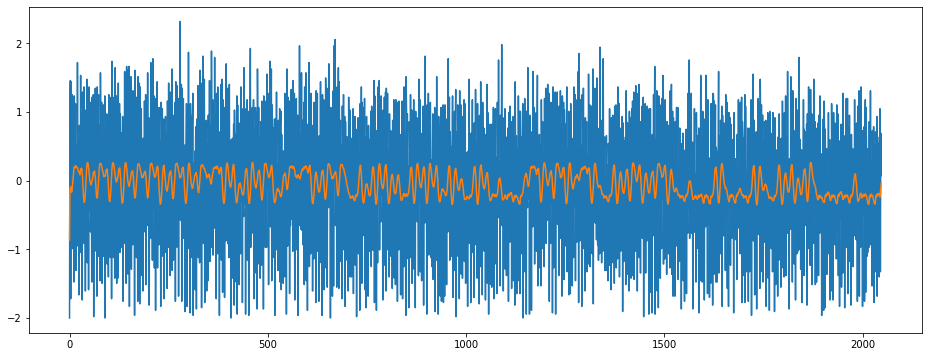

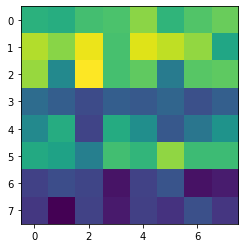

index:  309850
MAE:  0.8657171971600779
n_bunches       1358
bunch_index     2467
bunch_number     995
Name: 11004600, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6239/instability_data/06239_Inst_B1H_Q7_20170924_06h27m14s.h5


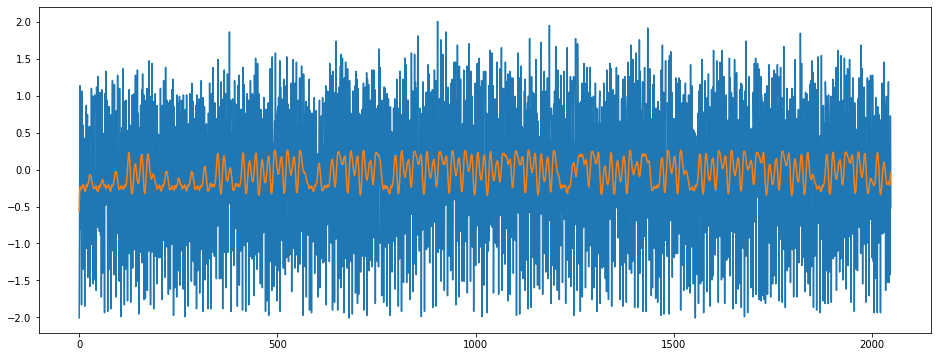

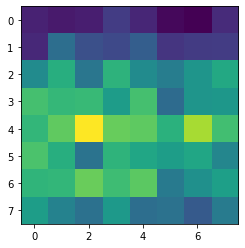

index:  344993
MAE:  0.8656248043999679
n_bunches       1916
bunch_index     3280
bunch_number    1809
Name: 2062796, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6243/instability_data/06243_Inst_B1H_Q7_20170926_03h22m14s.h5


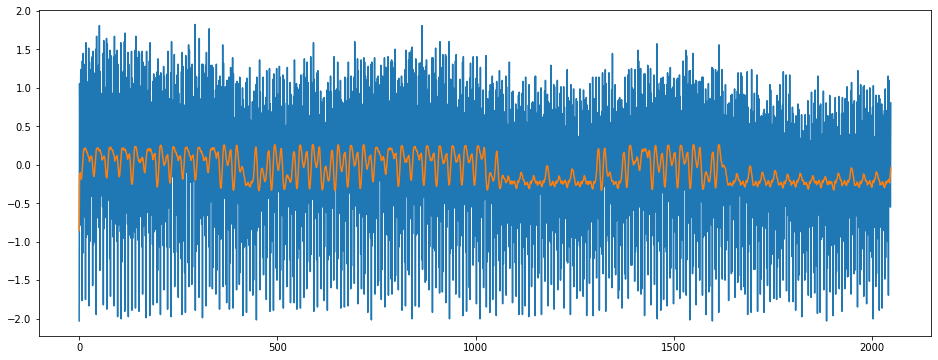

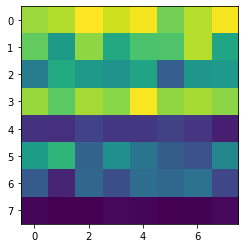

index:  173645
MAE:  0.865385407925954
n_bunches       2556
bunch_index     2763
bunch_number    2048
Name: 6182338, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7031/instability_data/07031_Inst_B1H_Q7_20180806_21h41m15s.h5


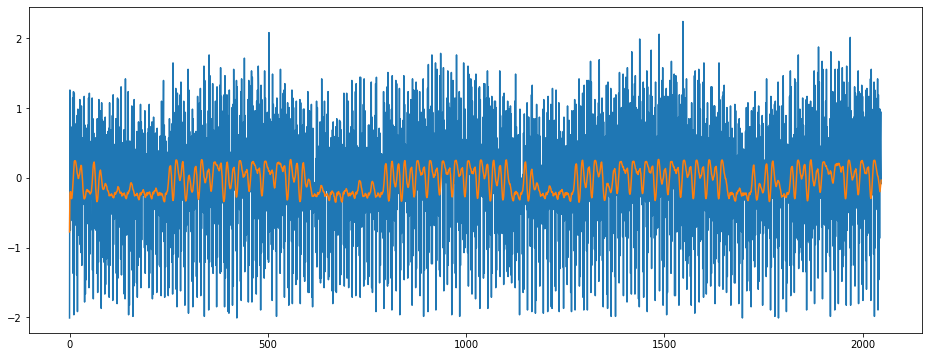

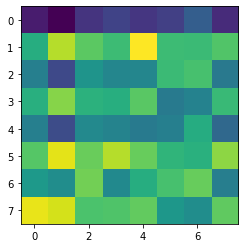

index:  268539
MAE:  0.8653776490249213
n_bunches       1551
bunch_index     2323
bunch_number    1108
Name: 5220776, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6692/instability_data/06692_Inst_B1H_Q7_20180516_18h52m14s.h5


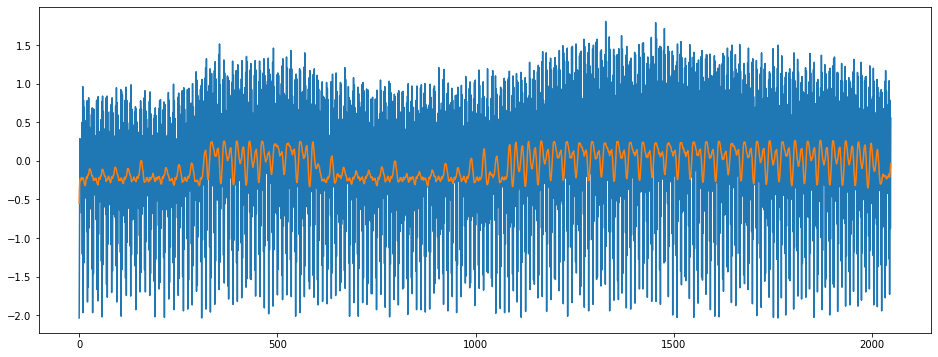

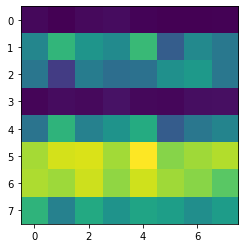

index:  204523
MAE:  0.865346317645573
n_bunches       396
bunch_index     232
bunch_number     96
Name: 6189263, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7354/instability_data/07354_Inst_B1H_Q7_20181025_20h15m16s.h5


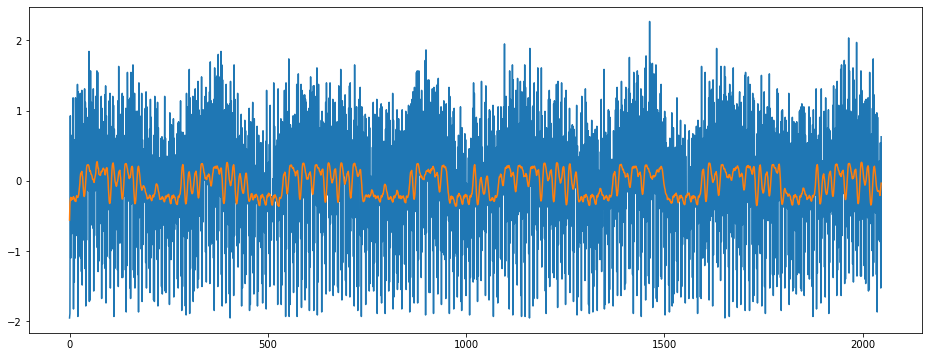

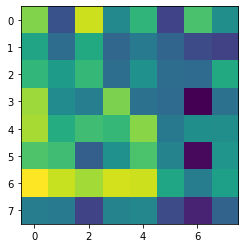

index:  260133
MAE:  0.865270827783365
n_bunches       2556
bunch_index     1481
bunch_number    1082
Name: 5098970, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7309/instability_data/07309_Inst_B1H_Q7_20181016_23h38m14s.h5


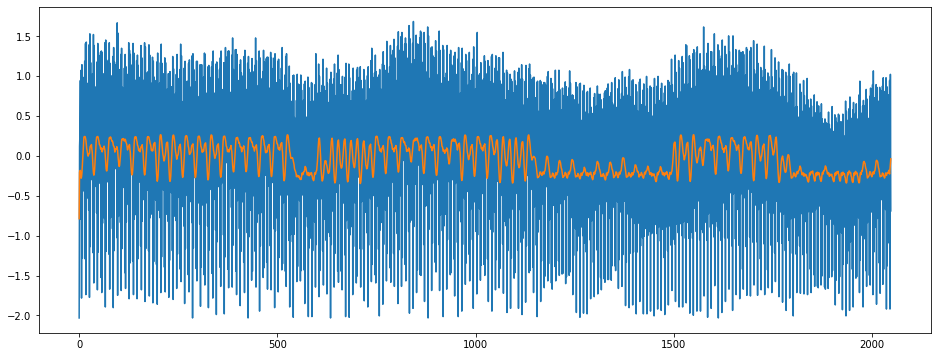

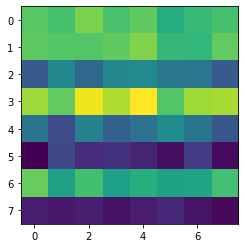

index:  175817
MAE:  0.8652484438403523
n_bunches       108
bunch_index     148
bunch_number     92
Name: 9898076, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7069/instability_data/07069_Inst_B1H_Q7_20180820_02h17m34s.h5


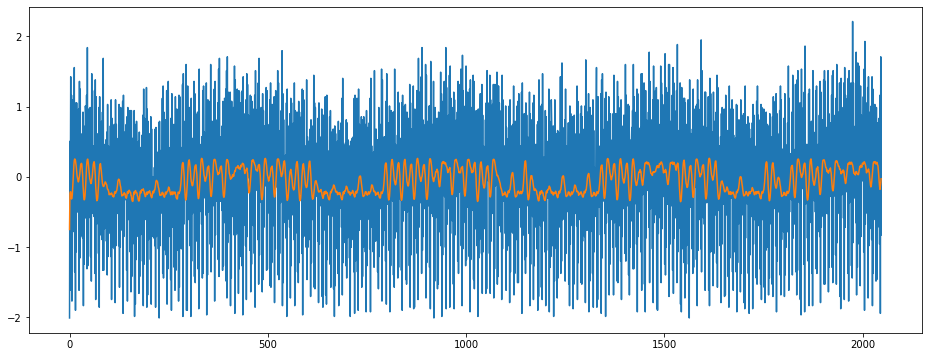

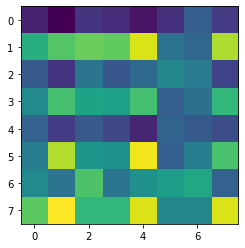

index:  105663
MAE:  0.8650554259367855
n_bunches       1227
bunch_index     3216
bunch_number    1168
Name: 10565294, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6690/instability_data/06690_Inst_B1H_Q7_20180516_09h06m14s.h5


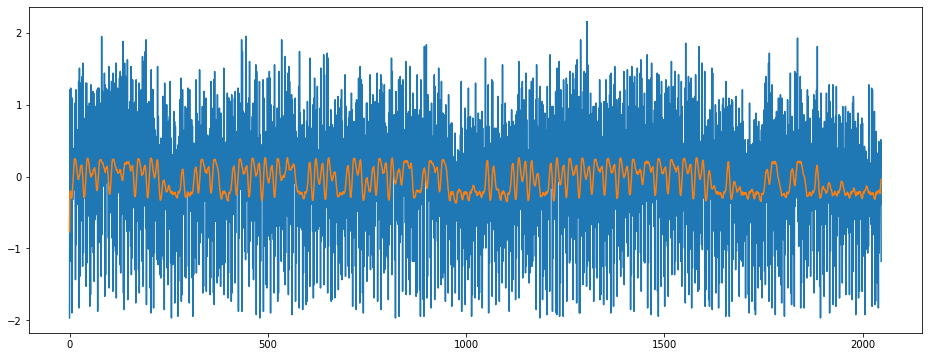

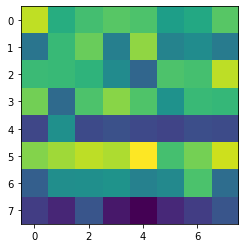

index:  303824
MAE:  0.8648256099165772
n_bunches        324
bunch_index     1682
bunch_number     307
Name: 6806374, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7443/instability_data/07443_Inst_B1H_Q7_20181114_15h59m23s.h5


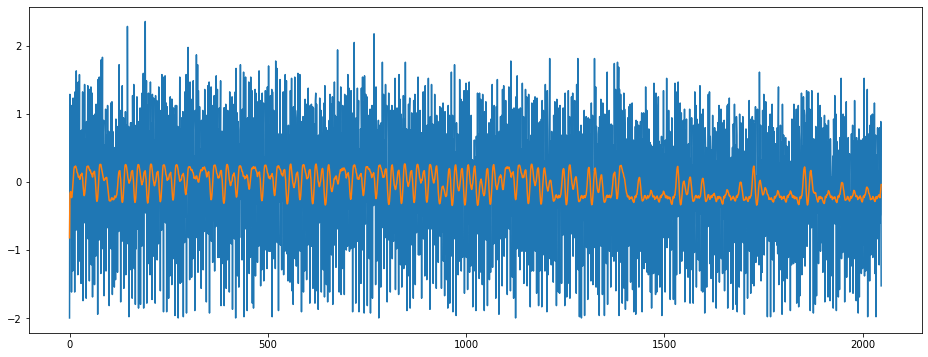

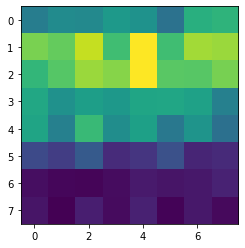

index:  267910
MAE:  0.8647144658304334
n_bunches        339
bunch_index     1191
bunch_number     168
Name: 771877, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6594/instability_data/06594_Inst_B1H_Q7_20180422_13h05m14s.h5


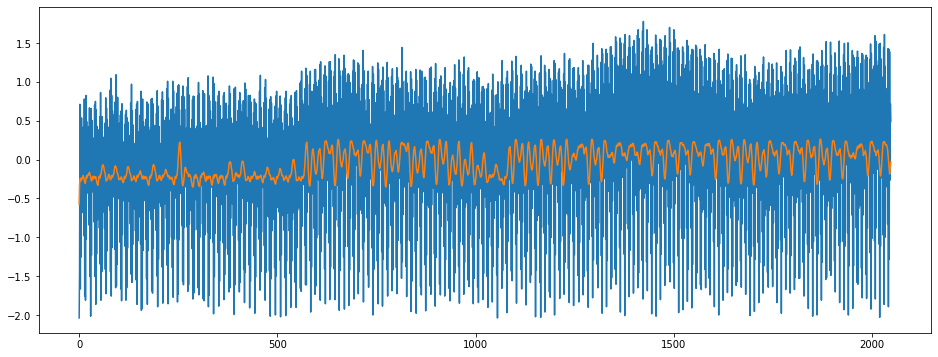

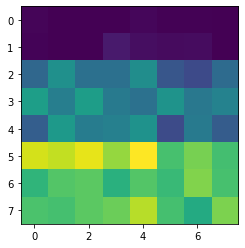

index:  287161
MAE:  0.8646924902656141
n_bunches       1292
bunch_index     3151
bunch_number    1145
Name: 7069193, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6396/instability_data/06396_Inst_B1H_Q7_20171117_01h51m14s.h5


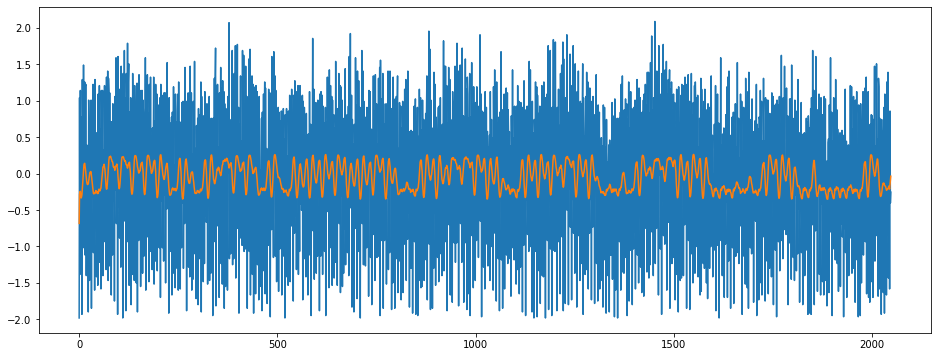

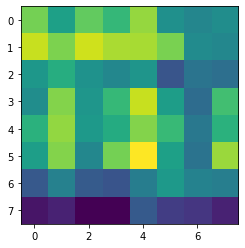

index:  304411
MAE:  0.8646533399214864
n_bunches       924
bunch_index     501
bunch_number    343
Name: 696605, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6744/instability_data/06744_Inst_B1H_Q7_20180531_03h40m56s.h5


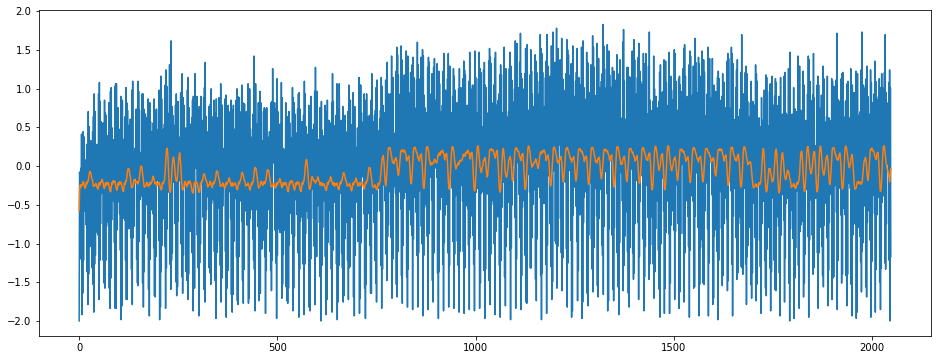

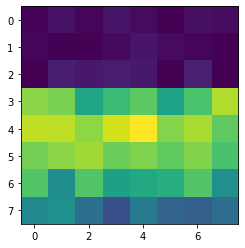

index:  305488
MAE:  0.8646074071176886
n_bunches       2556
bunch_index     1911
bunch_number    1411
Name: 7933770, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7033/instability_data/07033_Inst_B1H_Q7_20180807_07h25m15s.h5


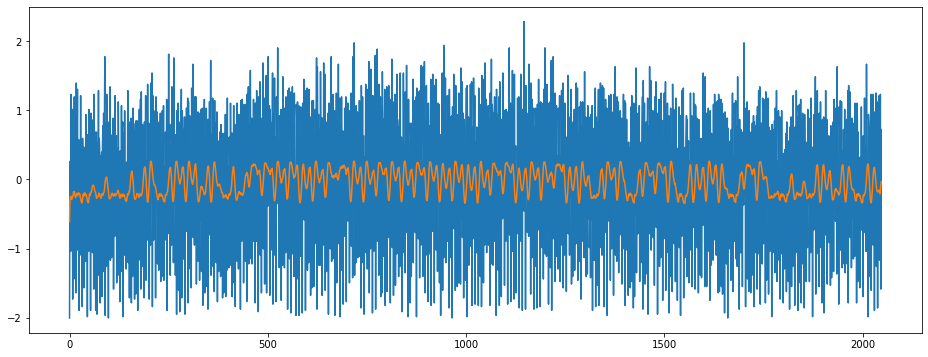

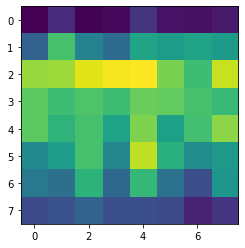

index:  292297
MAE:  0.8645515478850269
n_bunches       2556
bunch_index     1282
bunch_number     928
Name: 5194760, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7033/instability_data/07033_Inst_B1H_Q7_20180807_09h55m15s.h5


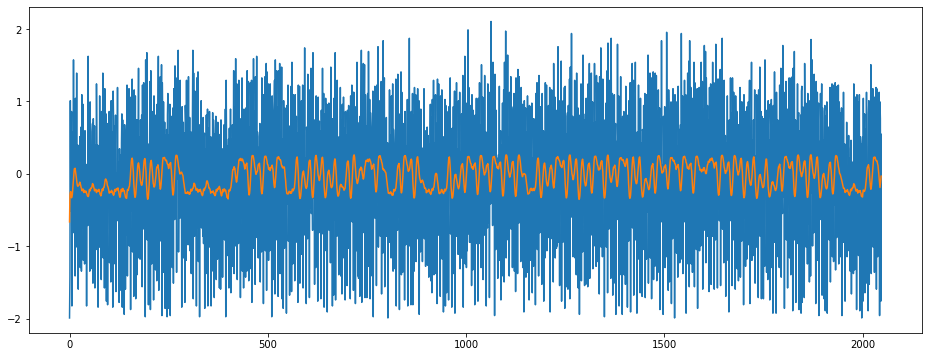

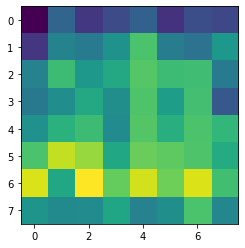

index:  307696
MAE:  0.8644653052466826
n_bunches       2556
bunch_index      591
bunch_number     414
Name: 3576724, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6919/instability_data/06919_Inst_B1H_Q7_20180714_02h22m14s.h5


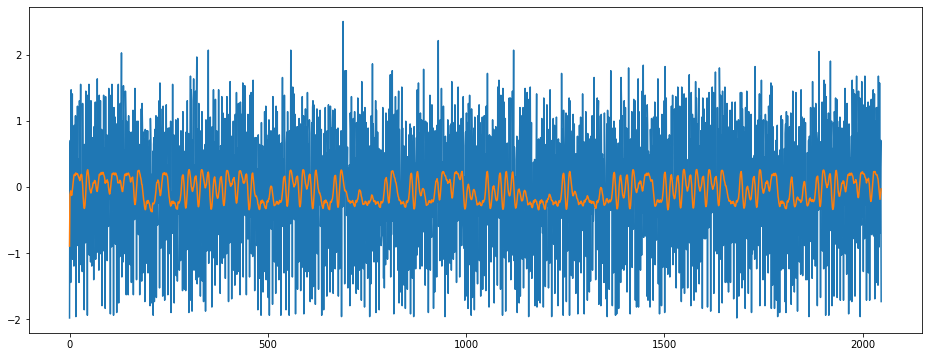

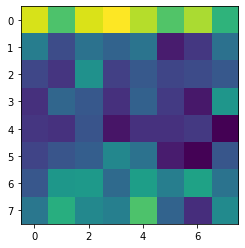

index:  173939
MAE:  0.8643255226064364
n_bunches       908
bunch_index     690
bunch_number    372
Name: 1767056, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6279/instability_data/06279_Inst_B1H_Q7_20171007_08h20m51s.h5


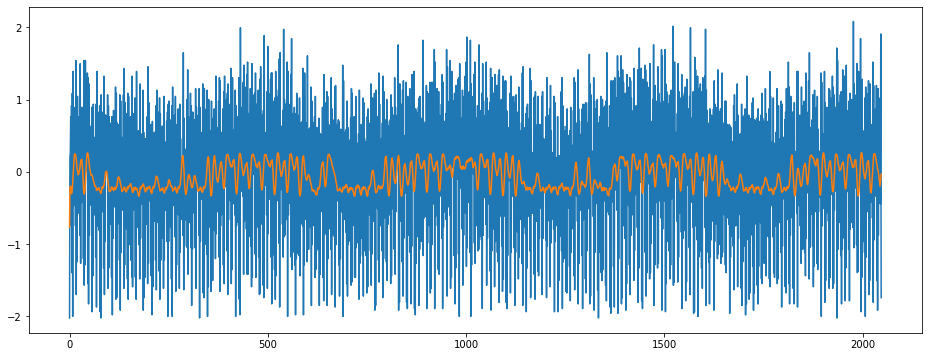

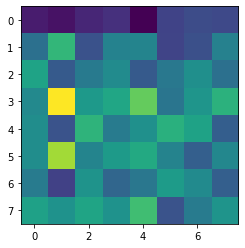

index:  347663
MAE:  0.8643172098879104
n_bunches       1868
bunch_index     2670
bunch_number    1426
Name: 6443846, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6356/instability_data/06356_Inst_B1H_Q7_20171102_04h22m14s.h5


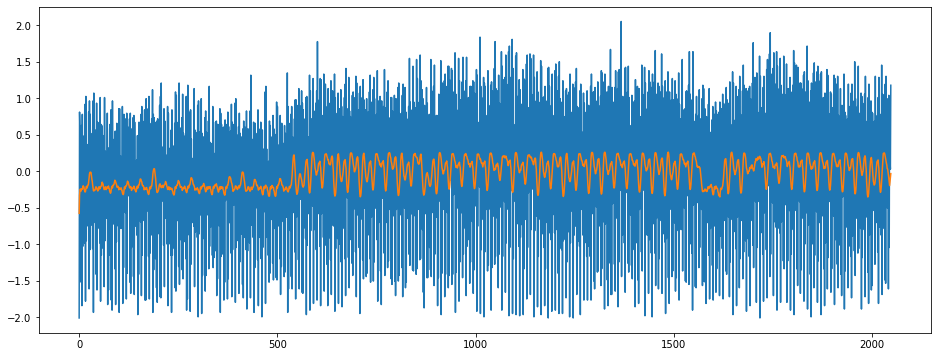

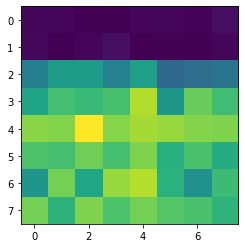

index:  299289
MAE:  0.8642935820277142
n_bunches       1868
bunch_index     2366
bunch_number    1270
Name: 367303, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6346/instability_data/06346_Inst_B1H_Q7_20171029_12h51m13s.h5


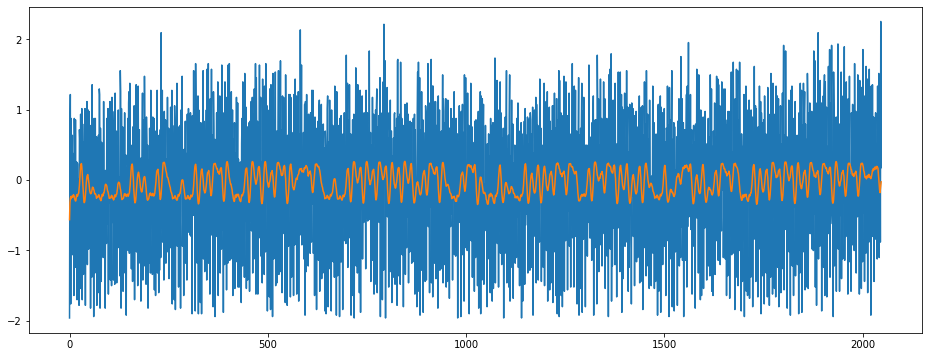

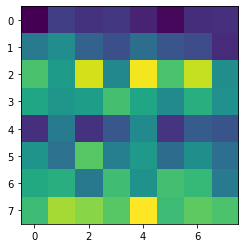

index:  174715
MAE:  0.8641179341843971
n_bunches       540
bunch_index     687
bunch_number    484
Name: 3281989, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6762/instability_data/06762_Inst_B1H_Q7_20180606_11h14m17s.h5


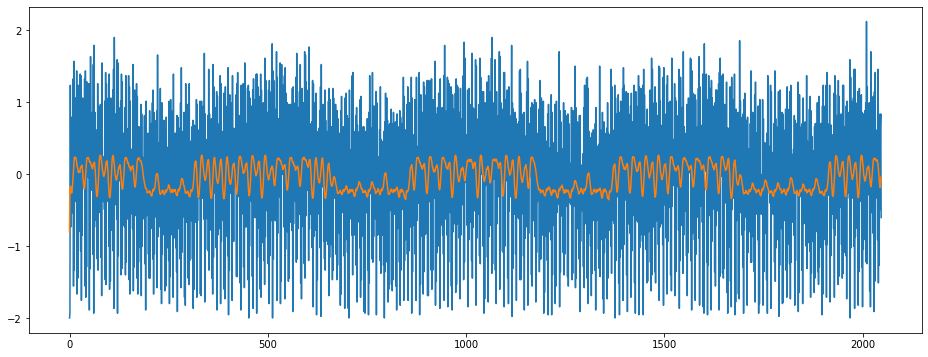

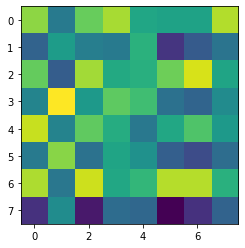

index:  316538
MAE:  0.864109804991583
n_bunches       1836
bunch_index     2115
bunch_number    1125
Name: 2489171, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6272/instability_data/06272_Inst_B1H_Q7_20171005_13h08m14s.h5


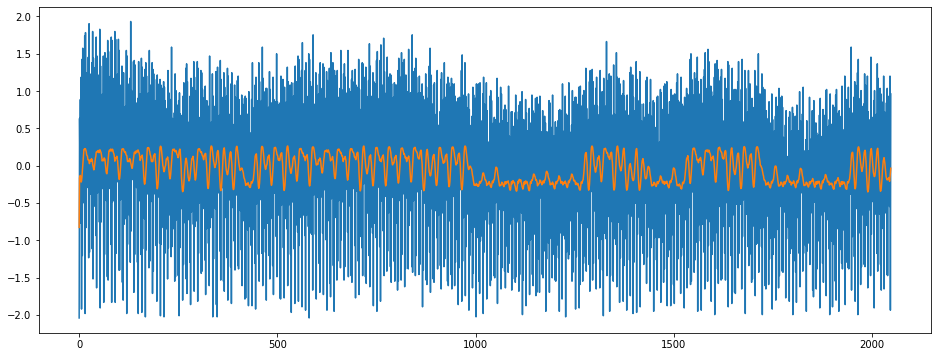

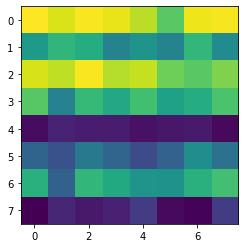

index:  247091
MAE:  0.8640998442570365
n_bunches       396
bunch_index     201
bunch_number    114
Name: 10181790, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7245/instability_data/07245_Inst_B1H_Q7_20181002_00h20m10s.h5


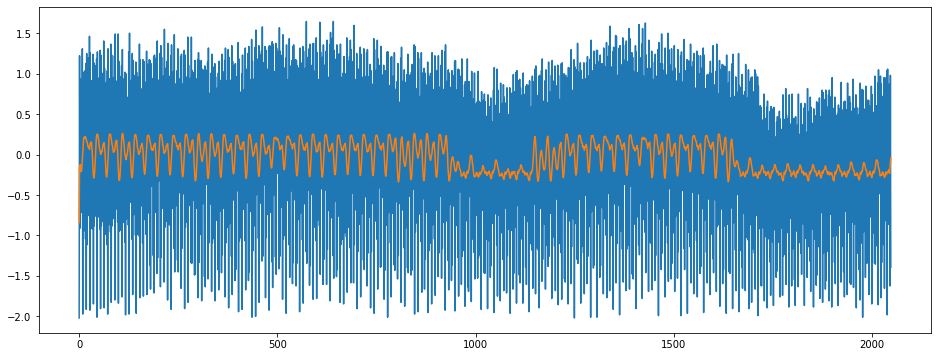

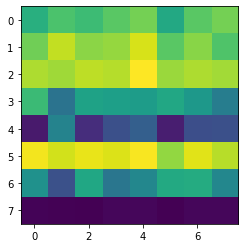

index:  174125
MAE:  0.8640444793031383
n_bunches       2175
bunch_index     3258
bunch_number    2148
Name: 8310621, dtype: object
/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6694/instability_data/06694_Inst_B1H_Q7_20180517_15h27m14s.h5


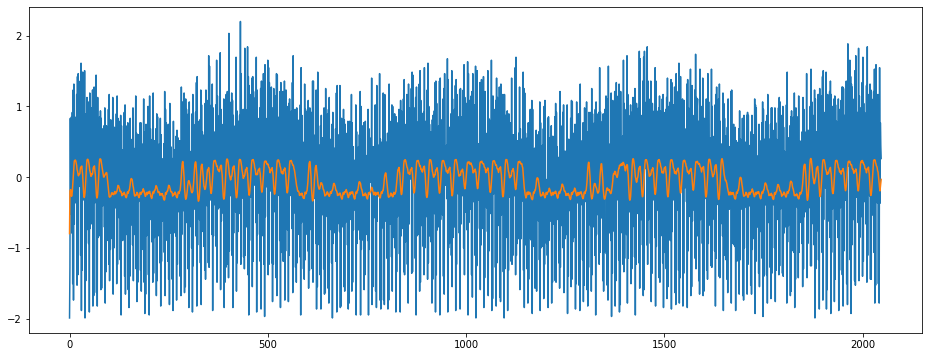

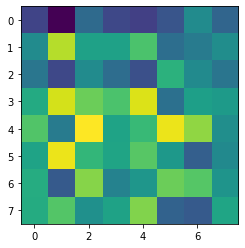

In [37]:
for i in range(50):
    anomalous = i
    anomalous_index = max_MAE_indices[anomalous]
    
    encoding_output = encoding_model(train_dataset[anomalous_index][None, :])

    print('index: ', anomalous_index)
    print("MAE: ", MAE_train[anomalous_index])
    # I'm not sure this row is correct
    metadata_row = train_generator.metadata.iloc[anomalous_index // 32]
    print(metadata_row[['n_bunches', 'bunch_index', 'bunch_number']])
    print(metadata_row['file'])

    true_signal = train_dataset[anomalous_index].squeeze()
    pred_signal = train_pred[anomalous_index].squeeze()

    plot_true_pred(true_signal, pred_signal)
    plt.show()
    plt.imshow(np.array(encoding_output).squeeze())
    plt.show()

# Generating an latent space image dataset

In [38]:
latent_dataset = []
latent_metadata = []
latent_input_data = []
for i in tqdm(range(65536)):
    anomalous = i
    anomalous_index = max_MAE_indices[anomalous]
    input_data = train_dataset[anomalous_index][None, :]
    encoding_output = encoding_model(input_data)
    latent_dataset.append(encoding_output)
    latent_input_data.append(input_data)
    # get the metadata
    metadata_row = train_generator.metadata.iloc[anomalous_index // 32]
    latent_metadata.append(metadata_row)
#     break

latent_dataset = np.vstack(latent_dataset)
latent_input_data = np.vstack(latent_input_data)
latent_metadata = pd.DataFrame(latent_metadata)

In [39]:
latent_metadata = pd.DataFrame(latent_metadata)

In [40]:
model_latent_space_folder = latent_space_folder / model_path.name
model_latent_space_file = model_latent_space_folder / f'latent_space_{latent_dataset.shape[0]}.npy'
model_latent_space_metadata_file = model_latent_space_folder / f'metadata_latent_space_{latent_dataset.shape[0]}.h5'
model_train_dataset_file = model_latent_space_folder / f'train_dataset_{train_dataset.shape[0]}.npy'
model_latent_input_file = model_latent_space_folder/ f"latent_input_{latent_input_data.shape[0]}.npy"
model_train_max_MAE_file = model_latent_space_folder / f'train_max_MAE_{max_MAE_indices.shape[0]}.npy'

In [41]:
if not model_latent_space_folder.is_dir():
    model_latent_space_folder.mkdir()

In [42]:
np.save(model_latent_space_file, latent_dataset)

In [43]:
latent_metadata.to_hdf(model_latent_space_metadata_file, 'data')

In [44]:
np.save(model_train_dataset_file, train_dataset)

OSError: [Errno 122] Disk quota exceeded

In [ ]:
np.save(model_train_max_MAE_file, max_MAE_indices)

In [ ]:
np.save(model_latent_input_file, latent_input_data)